In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
#!pip install pandas
#!pip install tqdm
#!pip install scipy
#!pip install matchms
#!pip install scikit-learn
#!pip install spec2vec

In [4]:
import os
os.chdir('/Users/sebas/projects/metabolomics')

In [45]:
import gensim
from src.load_data import LoadData
from src.config import Config
from matchms import calculate_scores
from matchms.importing import load_from_mgf,load_from_msp
from spec2vec import Spec2Vec
import matchms.filtering as msfilters
from spec2vec import SpectrumDocument
from spec2vec.model_building import train_new_word2vec_model
from tqdm import tqdm
from src.loader_saver import LoaderSaver
import itertools
import numpy as np
from matchms import calculate_scores
from matchms.importing import load_from_msp
from ms2deepscore import MS2DeepScore
from ms2deepscore.models import load_model
from matchms.similarity import ModifiedCosine

In [6]:
ls /Users/sebas/projects/data

ALL_GNPS_NO_PROPOGATED_wb.mgf
GNPS-NIH-NATURALPRODUCTSLIBRARY.mgf
all_spectrums_gnps.pkl
all_spectrums_gnps_nist_20240130_gnps_nist_janssen.pkl
all_spectrums_janssen.pkl
all_spectrums_nist.pkl
drug_plus.mgf
hr_msms_nist_all.MSP*
hr_msms_nist_sample.MSP
merged_gnps_nist_20240118_gnps_nist_janssen.pkl
ms2deepscore_positive_10k_1000_1000_1000_500.hdf5
spec2vec_AllPositive_ratio05_filtered_201101_iter_15.model
spec2vec_AllPositive_ratio05_filtered_201101_iter_15.model.trainables.syn1neg.npy
spec2vec_AllPositive_ratio05_filtered_201101_iter_15.model.wv.vectors.npy
uniformed_molecule_pairs_test.pkl


## Parameters

In [7]:
data_folder= '/Users/sebas/projects/data/'
dataset_path = data_folder + 'uniformed_molecule_pairs_test.pkl'
gnps_path =  data_folder + 'ALL_GNPS_NO_PROPOGATED_wb.mgf'
janssen_path = data_folder + 'drug_plus.mgf'
nist_path = data_folder + 'hr_msms_nist_all.MSP'
output_pairs_file= data_folder + 'molecular_pairs.pkl'
output_nist_file= data_folder + 'all_spectrums_nist.pkl'
output_gnps_file= data_folder + 'all_spectrums_gnps.pkl'
output_janssen_file= data_folder + 'all_spectrums_janssen.pkl'
model_spec2vec_file = data_folder + 'spec2vec_AllPositive_ratio05_filtered_201101_iter_15.model'
model_ms2d_file= data_folder + 'ms2deepscore_positive_10k_1000_1000_1000_500.hdf5'
uniformed_molecule_pairs_test_path= data_folder +'uniformed_molecule_pairs_test.pkl'
load_molecule_pairs_file= True

In [8]:
## Load spectrum using spectrumutils

In [9]:
config=Config()

## Load all the data

In [10]:
#max_number_spectra_gnps=1000000
#max_number_spectra_janssen= 10000000
#max_number_spectra_nist=2000
#block_size_nist=30000

In [11]:
#loader_saver = LoaderSaver(block_size=block_size_nist, 
#                               pickle_nist_path =output_nist_file,
#                               pickle_gnps_path =output_gnps_file,
#                               pickle_janssen_path=output_janssen_file
#                               )

In [12]:
#all_spectrums_janssen = loader_saver.get_all_spectrums(janssen_path,max_number_spectra_janssen, use_tqdm=True, use_nist=False, config=config, use_janssen=True)

In [13]:
#all_spectrums_gnps = loader_saver.get_all_spectrums(gnps_path,max_number_spectra_gnps, use_tqdm=True, use_nist=False, config=config)

In [14]:
#all_spectrums_nist = loader_saver.get_all_spectrums(nist_path,max_number_spectra_nist, use_tqdm=True, use_nist=True, config=config)

In [15]:
#len(all_spectrums_gnps), len(all_spectrums_nist), len(all_spectrums_janssen)

In [16]:
#all_spectrums = all_spectrums_gnps + all_spectrums_nist + all_spectrums_janssen

## Load data through matchms

In [17]:
all_spectrums_gnps_MATCHMS = [(s) for s in load_from_mgf(gnps_path)]

In [18]:
all_spectrums_janssen_MATCHMS = [(s) for s in load_from_mgf(janssen_path)]

2024-02-02 11:08:02,548:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,550:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,550:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,551:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,552:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,552:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,553:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,554:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,554:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,555:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,556:WARNING:matchms:add_retention:N/A can't be converted to float.
2024-02-02 11:08:02,556:WARNING:matchms:add

In [19]:
#all_spectrums_nist_MATCHMS = list(itertools.islice(load_from_msp(nist_path), 30000))
all_spectrums_nist_MATCHMS = [s for s in load_from_msp(nist_path)]

In [20]:
len(all_spectrums_gnps_MATCHMS),len(all_spectrums_janssen_MATCHMS),len(all_spectrums_nist_MATCHMS)

(504840, 2546, 1026712)

In [21]:
all_spectrums_MATCHMS = all_spectrums_gnps_MATCHMS + all_spectrums_janssen_MATCHMS + all_spectrums_nist_MATCHMS

## Compute a set of molecular pairs

In [22]:
import dill
from src.load_data import LoadData
from sklearn.model_selection import train_test_split
from src.train_utils import TrainUtils
from src.preprocessor import Preprocessor
import pickle
import sys
from src.config import Config
from src.parser import Parser
from datetime import datetime
from src.loader_saver import LoaderSaver


In [23]:

if load_molecule_pairs_file:
        with open(uniformed_molecule_pairs_test_path, 'rb') as file:
            dataset = dill.load(file)
        molecule_pairs= dataset['uniformed_molecule_pairs_test']
else:
        number_pairs=10000
        molecule_pairs= TrainUtils.compute_all_tanimoto_results(all_spectrums, 
                                                                max_combinations=number_pairs, 
                                                                use_tqdm=True, 
                                                                max_mass_diff=config.MAX_MASS_DIFF, 
                                                                min_mass_diff=config.MIN_MASS_DIFF)

In [24]:
len(molecule_pairs)

196450

## Use the molecular pairs to match the spectra in matchms

In [25]:
hash_gnps_MATCHMS = [s.spectrum_hash() for s in all_spectrums_gnps_MATCHMS]

In [26]:
hash_janssen_MATCHMS = [s.spectrum_hash() for s in all_spectrums_janssen_MATCHMS]

In [27]:
hash_nist_MATCHMS = [s.spectrum_hash() for s in all_spectrums_nist_MATCHMS]

In [28]:
## check that each one of the datasets is in the respective ms foldersm

In [30]:
#is_hash_gnps_su_in_matchms = not(False in [(s.spectrum_hash in hash_gnps_MATCHMS) for s in all_spectrums_gnps])
#is_hash_gnps_su_in_matchms

In [31]:
#is_hash_janssen_su_in_matchms = not(False in [(s.spectrum_hash in hash_janssen_MATCHMS) for s in all_spectrums_janssen])
#is_hash_janssen_su_in_matchms

In [32]:
#is_hash_nist_su_in_matchms = not(False in [(s.spectrum_hash in hash_nist_MATCHMS) for s in all_spectrums_nist])
#is_hash_nist_su_in_matchms

In [33]:
## sanity check to see that there are no cross appearences

## Load spec2vec model

In [34]:
# Import pre-trained word2vec model (see code example above)
#model_file = "references.model"
model = gensim.models.Word2Vec.load(model_spec2vec_file)

In [35]:
# Define similarity_function
spec2vec_similarity = Spec2Vec(model=model, intensity_weighting_power=0.5,
                               allowed_missing_percentage=100.0)

## compute spec2vec

In [36]:
def spectrum_processing(s):
    """This is how one would typically design a desired pre- and post-
    processing pipeline."""
    s = msfilters.default_filters(s)
    s = msfilters.add_parent_mass(s)
    s = msfilters.normalize_intensities(s)
    s = msfilters.reduce_to_number_of_peaks(s, n_required=10, ratio_desired=None, n_max=500)
    #s = msfilters.reduce_to_number_of_peaks(s, n_required=10, ratio_desired=0.5, n_max=500)
    s = msfilters.select_by_mz(s, mz_from=0, mz_to=1000)
    s = msfilters.add_losses(s, loss_mz_from=10.0, loss_mz_to=200.0)
    s = msfilters.require_minimum_number_of_peaks(s, n_required=10)
    return s

In [37]:
target_hashes = [s.spectrum_hash() for s in all_spectrums_MATCHMS]

In [38]:
unique_hashes_in_molecule_pairs= np.unique([m.spectrum_object_0.spectrum_hash for m in molecule_pairs]+[m.spectrum_object_1.spectrum_hash for m in molecule_pairs])

In [39]:
spectrums_match_hash= [(s,t) for s,t in zip(all_spectrums_MATCHMS, target_hashes) if (t in unique_hashes_in_molecule_pairs)]

In [40]:
original_spectrum_match_hash= [p[0] for p in spectrums_match_hash]
target_hashes_subset = [p[1] for p in spectrums_match_hash]

In [41]:
preprocessed_spectrums = original_spectrum_match_hash.copy()

In [42]:
for i in tqdm(range(len(original_spectrum_match_hash))):
    preprocessed_spectrums[i] = spectrum_processing(original_spectrum_match_hash[i])

 21%|██████████████████████████████████▋                                                                                                                                      | 6571/31990 [00:13<00:39, 639.99it/s]

2024-02-02 11:18:11,845:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:11,845:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:11,846:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:11,847:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:11,848:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:11,848:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:11,849:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 21%|███████████████████████████████████                                                                                                                                      | 6642/31990 [00:13<00:38, 658.57it/s]

2024-02-02 11:18:11,909:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:11,910:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:11,911:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:11,911:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:11,912:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:11,913:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:11,914:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 21%|███████████████████████████████████▍                                                                                                                                     | 6708/31990 [00:13<00:42, 596.30it/s]

2024-02-02 11:18:12,045:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,045:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,046:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,047:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,048:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,048:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,049:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 21%|███████████████████████████████████▊                                                                                                                                     | 6779/31990 [00:13<00:40, 627.32it/s]

2024-02-02 11:18:12,145:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,145:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,146:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,146:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,147:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,148:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,149:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 21%|████████████████████████████████████▏                                                                                                                                    | 6853/31990 [00:13<00:38, 657.45it/s]

2024-02-02 11:18:12,246:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,246:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,248:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,248:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,249:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,249:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,251:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 22%|████████████████████████████████████▌                                                                                                                                    | 6920/31990 [00:13<00:38, 648.88it/s]

2024-02-02 11:18:12,354:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,354:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,357:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,358:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,359:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,360:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,362:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 22%|████████████████████████████████████▉                                                                                                                                    | 6986/31990 [00:14<00:43, 573.11it/s]

2024-02-02 11:18:12,501:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,501:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,502:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,502:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,503:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,503:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,504:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 22%|█████████████████████████████████████▎                                                                                                                                   | 7060/31990 [00:14<00:40, 616.91it/s]

2024-02-02 11:18:12,601:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,601:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,602:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,603:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,604:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,604:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,605:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 22%|█████████████████████████████████████▋                                                                                                                                   | 7131/31990 [00:14<00:38, 641.51it/s]

2024-02-02 11:18:12,702:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,702:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,703:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,703:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,705:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,705:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,706:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 22%|██████████████████████████████████████                                                                                                                                   | 7197/31990 [00:14<00:43, 572.90it/s]

2024-02-02 11:18:12,848:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,849:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,850:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,851:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,852:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,854:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,856:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 23%|██████████████████████████████████████▎                                                                                                                                  | 7257/31990 [00:14<00:44, 555.87it/s]

2024-02-02 11:18:12,964:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,965:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,967:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,968:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,970:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:12,970:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:12,972:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 23%|██████████████████████████████████████▋                                                                                                                                  | 7322/31990 [00:14<00:42, 580.34it/s]

2024-02-02 11:18:13,064:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,064:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,066:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,066:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,067:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,067:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,069:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 23%|███████████████████████████████████████                                                                                                                                  | 7395/31990 [00:14<00:39, 620.62it/s]

2024-02-02 11:18:13,164:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,165:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,166:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,166:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,167:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,167:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,168:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 23%|███████████████████████████████████████▍                                                                                                                                 | 7459/31990 [00:14<00:39, 622.09it/s]

2024-02-02 11:18:13,267:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,268:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,270:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,270:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,271:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,271:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,272:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 24%|███████████████████████████████████████▋                                                                                                                                 | 7523/31990 [00:14<00:39, 615.00it/s]

2024-02-02 11:18:13,374:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,374:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,375:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,375:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,376:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,376:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,378:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 24%|████████████████████████████████████████▏                                                                                                                                | 7598/31990 [00:15<00:37, 652.10it/s]

2024-02-02 11:18:13,474:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,475:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,476:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,478:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,478:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,479:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 24%|████████████████████████████████████████▍                                                                                                                                | 7664/31990 [00:15<00:51, 473.85it/s]

2024-02-02 11:18:13,707:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,708:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,711:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,711:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,714:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,714:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,717:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 24%|████████████████████████████████████████▊                                                                                                                                | 7719/31990 [00:15<00:59, 407.97it/s]

2024-02-02 11:18:13,896:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,897:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,900:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,900:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,904:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:13,904:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:13,908:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 24%|█████████████████████████████████████████                                                                                                                                | 7766/31990 [00:15<01:06, 363.67it/s]

2024-02-02 11:18:14,070:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,070:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,074:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,074:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,077:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,078:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,083:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 24%|█████████████████████████████████████████▏                                                                                                                               | 7808/31990 [00:15<01:20, 301.38it/s]

2024-02-02 11:18:14,289:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,289:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,293:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,294:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,300:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,302:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,310:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|█████████████████████████████████████████▍                                                                                                                               | 7843/31990 [00:16<01:30, 265.68it/s]

2024-02-02 11:18:14,475:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,475:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,478:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,478:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,482:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,482:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,486:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|█████████████████████████████████████████▌                                                                                                                               | 7873/31990 [00:16<01:30, 267.04it/s]

2024-02-02 11:18:14,586:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,586:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,589:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,590:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,593:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,593:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,597:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|█████████████████████████████████████████▊                                                                                                                               | 7903/31990 [00:16<01:28, 272.38it/s]

2024-02-02 11:18:14,688:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,688:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,691:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,692:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,694:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,694:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,698:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|█████████████████████████████████████████▉                                                                                                                               | 7933/31990 [00:16<01:29, 268.74it/s]

2024-02-02 11:18:14,804:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,804:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,808:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,808:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,812:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,813:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,817:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|██████████████████████████████████████████                                                                                                                               | 7962/31990 [00:16<01:34, 252.97it/s]

2024-02-02 11:18:14,938:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,938:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,941:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,941:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,945:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:14,945:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:14,950:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|██████████████████████████████████████████▏                                                                                                                              | 7989/31990 [00:16<01:37, 245.81it/s]

2024-02-02 11:18:15,058:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,058:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,062:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,062:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,065:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,066:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,068:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|██████████████████████████████████████████▎                                                                                                                              | 8019/31990 [00:16<01:32, 257.82it/s]

2024-02-02 11:18:15,160:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,160:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,162:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,162:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,166:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,166:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,170:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|██████████████████████████████████████████▌                                                                                                                              | 8047/31990 [00:16<01:31, 262.01it/s]

2024-02-02 11:18:15,262:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,262:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,266:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,266:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,269:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,269:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,272:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|██████████████████████████████████████████▋                                                                                                                              | 8074/31990 [00:16<01:32, 258.52it/s]

2024-02-02 11:18:15,371:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,371:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,376:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,376:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,381:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,381:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,387:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|██████████████████████████████████████████▊                                                                                                                              | 8101/31990 [00:17<01:34, 252.49it/s]

2024-02-02 11:18:15,483:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,484:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,487:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,487:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,490:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,491:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,494:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|██████████████████████████████████████████▉                                                                                                                              | 8129/31990 [00:17<01:33, 255.75it/s]

2024-02-02 11:18:15,589:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,589:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,593:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,593:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,597:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,597:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,602:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 25%|███████████████████████████████████████████                                                                                                                              | 8156/31990 [00:17<01:32, 258.04it/s]

2024-02-02 11:18:15,692:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,692:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,695:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,695:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,697:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,697:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,701:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|███████████████████████████████████████████▏                                                                                                                             | 8184/31990 [00:17<01:31, 260.98it/s]

2024-02-02 11:18:15,797:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,797:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,802:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,802:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,806:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,807:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,811:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|███████████████████████████████████████████▍                                                                                                                             | 8211/31990 [00:17<01:30, 261.57it/s]

2024-02-02 11:18:15,899:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,899:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,903:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,903:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,906:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:15,906:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:15,909:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|███████████████████████████████████████████▌                                                                                                                             | 8240/31990 [00:17<01:28, 268.83it/s]

2024-02-02 11:18:16,001:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,001:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,005:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,005:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,009:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,009:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,014:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|███████████████████████████████████████████▋                                                                                                                             | 8268/31990 [00:17<01:27, 269.92it/s]

2024-02-02 11:18:16,103:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,103:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,107:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,107:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,111:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,111:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,115:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|███████████████████████████████████████████▊                                                                                                                             | 8296/31990 [00:17<01:29, 263.52it/s]

2024-02-02 11:18:16,216:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,216:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,220:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,221:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,225:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,226:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,230:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|███████████████████████████████████████████▉                                                                                                                             | 8323/31990 [00:17<01:35, 247.28it/s]

2024-02-02 11:18:16,341:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,342:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,346:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,346:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,350:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,351:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,354:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|████████████████████████████████████████████▏                                                                                                                            | 8356/31990 [00:18<01:27, 268.98it/s]

2024-02-02 11:18:16,442:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,442:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,445:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,445:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,448:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,448:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,452:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|████████████████████████████████████████████▎                                                                                                                            | 8387/31990 [00:18<01:24, 280.12it/s]

2024-02-02 11:18:16,542:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,543:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,546:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,546:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,549:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,549:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,552:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|████████████████████████████████████████████▍                                                                                                                            | 8416/31990 [00:18<01:26, 273.06it/s]

2024-02-02 11:18:16,656:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,656:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,660:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,660:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,662:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,662:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,665:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 26%|████████████████████████████████████████████▌                                                                                                                            | 8444/31990 [00:18<01:25, 274.16it/s]

2024-02-02 11:18:16,757:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,757:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,762:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,762:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,766:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,766:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,770:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|████████████████████████████████████████████▊                                                                                                                            | 8482/31990 [00:18<01:17, 302.69it/s]

2024-02-02 11:18:16,858:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,858:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,860:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,861:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,863:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,863:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,865:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|█████████████████████████████████████████████                                                                                                                            | 8519/31990 [00:18<01:13, 320.57it/s]

2024-02-02 11:18:16,960:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,961:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,964:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,964:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,967:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:16,967:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:16,971:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|█████████████████████████████████████████████▏                                                                                                                           | 8553/31990 [00:18<01:12, 323.48it/s]

2024-02-02 11:18:17,064:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,064:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,068:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,068:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,072:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,072:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,076:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|█████████████████████████████████████████████▎                                                                                                                           | 8587/31990 [00:18<01:11, 326.60it/s]

2024-02-02 11:18:17,165:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,165:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,168:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,168:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,171:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,171:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,174:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|█████████████████████████████████████████████▌                                                                                                                           | 8620/31990 [00:18<01:14, 313.79it/s]

2024-02-02 11:18:17,280:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,280:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,283:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,283:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,286:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,287:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,290:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|█████████████████████████████████████████████▋                                                                                                                           | 8652/31990 [00:19<01:20, 290.45it/s]

2024-02-02 11:18:17,413:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,413:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,420:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,420:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,426:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,426:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,430:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|█████████████████████████████████████████████▊                                                                                                                           | 8682/31990 [00:19<01:26, 268.07it/s]

2024-02-02 11:18:17,544:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,545:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,549:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,550:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,554:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,555:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,558:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|██████████████████████████████████████████████                                                                                                                           | 8710/31990 [00:19<01:34, 245.98it/s]

2024-02-02 11:18:17,683:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,683:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,685:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,685:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,687:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,688:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,690:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|██████████████████████████████████████████████▏                                                                                                                          | 8736/31990 [00:19<01:38, 235.61it/s]

2024-02-02 11:18:17,809:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,809:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,817:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,817:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,826:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,834:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|██████████████████████████████████████████████▎                                                                                                                          | 8760/31990 [00:19<01:54, 203.76it/s]

2024-02-02 11:18:17,970:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,970:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,973:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,974:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:17,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:17,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 27%|██████████████████████████████████████████████▍                                                                                                                          | 8782/31990 [00:19<02:02, 190.00it/s]

2024-02-02 11:18:18,110:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,110:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,116:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,116:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,121:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,121:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,125:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|██████████████████████████████████████████████▌                                                                                                                          | 8802/31990 [00:19<02:02, 189.92it/s]

2024-02-02 11:18:18,216:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,216:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,223:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,223:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,231:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,231:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,239:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|██████████████████████████████████████████████▌                                                                                                                          | 8825/31990 [00:19<01:58, 195.78it/s]

2024-02-02 11:18:18,325:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,325:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,332:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,332:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,339:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,339:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,345:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|██████████████████████████████████████████████▋                                                                                                                          | 8845/31990 [00:20<02:03, 186.67it/s]

2024-02-02 11:18:18,447:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,447:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,452:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,453:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,457:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,458:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,464:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|██████████████████████████████████████████████▊                                                                                                                          | 8864/31990 [00:20<02:08, 179.74it/s]

2024-02-02 11:18:18,563:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,563:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,569:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,570:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,576:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,577:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,582:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|██████████████████████████████████████████████▉                                                                                                                          | 8883/31990 [00:20<02:11, 176.00it/s]

2024-02-02 11:18:18,676:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,676:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,681:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,681:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,684:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,685:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,689:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|███████████████████████████████████████████████                                                                                                                          | 8901/31990 [00:20<02:10, 176.81it/s]

2024-02-02 11:18:18,775:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,775:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,779:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,779:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,785:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,785:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,790:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|███████████████████████████████████████████████                                                                                                                          | 8919/31990 [00:20<02:17, 168.04it/s]

2024-02-02 11:18:18,898:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,898:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,904:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,904:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,910:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,910:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:18,916:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|███████████████████████████████████████████████▏                                                                                                                         | 8943/31990 [00:20<02:03, 187.23it/s]

2024-02-02 11:18:18,996:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:18,997:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,000:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,002:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,002:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,004:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|███████████████████████████████████████████████▍                                                                                                                         | 8978/31990 [00:20<01:39, 230.78it/s]

2024-02-02 11:18:19,099:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,099:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,101:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,101:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,103:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,104:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,106:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|███████████████████████████████████████████████▌                                                                                                                         | 9008/31990 [00:20<01:31, 250.01it/s]

2024-02-02 11:18:19,200:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,200:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,204:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,204:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,207:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,207:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,210:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|███████████████████████████████████████████████▋                                                                                                                         | 9035/31990 [00:20<01:29, 255.15it/s]

2024-02-02 11:18:19,300:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,300:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,303:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,304:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,307:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,307:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,310:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|███████████████████████████████████████████████▊                                                                                                                         | 9061/31990 [00:21<01:36, 238.56it/s]

2024-02-02 11:18:19,430:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,431:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,436:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,436:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,438:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,439:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,442:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|████████████████████████████████████████████████                                                                                                                         | 9087/31990 [00:21<01:33, 243.71it/s]

2024-02-02 11:18:19,528:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,528:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,532:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,532:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,535:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,535:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,538:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 28%|████████████████████████████████████████████████▏                                                                                                                        | 9117/31990 [00:21<01:28, 257.93it/s]

2024-02-02 11:18:19,630:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,630:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,634:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,634:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,638:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,638:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,642:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|████████████████████████████████████████████████▎                                                                                                                        | 9144/31990 [00:21<01:35, 239.93it/s]

2024-02-02 11:18:19,762:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,762:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,767:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,767:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,771:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,771:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,775:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|████████████████████████████████████████████████▍                                                                                                                        | 9169/31990 [00:21<01:42, 221.65it/s]

2024-02-02 11:18:19,898:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,898:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,903:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,903:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,906:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,906:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:19,910:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|████████████████████████████████████████████████▌                                                                                                                        | 9195/31990 [00:21<01:38, 230.89it/s]

2024-02-02 11:18:19,997:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:19,997:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,001:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,001:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,005:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,006:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,010:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|████████████████████████████████████████████████▋                                                                                                                        | 9219/31990 [00:21<01:46, 213.56it/s]

2024-02-02 11:18:20,134:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,134:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,140:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,140:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,146:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,146:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,152:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|████████████████████████████████████████████████▊                                                                                                                        | 9241/31990 [00:21<01:51, 203.87it/s]

2024-02-02 11:18:20,253:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,253:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,257:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,257:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,261:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,264:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|████████████████████████████████████████████████▉                                                                                                                        | 9267/31990 [00:21<01:44, 217.74it/s]

2024-02-02 11:18:20,357:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,357:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,364:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,364:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,371:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,371:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,377:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|█████████████████████████████████████████████████                                                                                                                        | 9291/31990 [00:22<01:43, 219.91it/s]

2024-02-02 11:18:20,463:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,463:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,468:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,468:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,474:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,474:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,480:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|█████████████████████████████████████████████████▏                                                                                                                       | 9319/31990 [00:22<01:36, 235.00it/s]

2024-02-02 11:18:20,563:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,563:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,568:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,572:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,572:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,577:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|█████████████████████████████████████████████████▎                                                                                                                       | 9344/31990 [00:22<01:35, 238.14it/s]

2024-02-02 11:18:20,664:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,664:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,666:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,667:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,670:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,670:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,673:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|█████████████████████████████████████████████████▍                                                                                                                       | 9369/31990 [00:22<01:33, 240.99it/s]

2024-02-02 11:18:20,765:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,765:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,769:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,769:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,773:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,773:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,778:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|█████████████████████████████████████████████████▋                                                                                                                       | 9394/31990 [00:22<01:44, 216.38it/s]

2024-02-02 11:18:20,912:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,912:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,918:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,918:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,925:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:20,925:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:20,932:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 29%|█████████████████████████████████████████████████▋                                                                                                                       | 9417/31990 [00:22<01:48, 208.31it/s]

2024-02-02 11:18:21,030:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,030:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,035:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,035:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,039:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,040:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,044:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|█████████████████████████████████████████████████▉                                                                                                                       | 9441/31990 [00:22<01:44, 214.84it/s]

2024-02-02 11:18:21,133:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,134:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,138:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,138:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,142:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,142:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,147:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|█████████████████████████████████████████████████▉                                                                                                                       | 9463/31990 [00:22<01:54, 197.00it/s]

2024-02-02 11:18:21,270:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,270:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,274:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,275:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,278:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,278:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,282:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|██████████████████████████████████████████████████▏                                                                                                                      | 9490/31990 [00:22<01:44, 216.11it/s]

2024-02-02 11:18:21,369:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,369:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,374:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,374:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,379:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,379:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,383:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|██████████████████████████████████████████████████▎                                                                                                                      | 9516/31990 [00:23<01:39, 226.11it/s]

2024-02-02 11:18:21,473:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,473:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,477:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,477:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,480:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,480:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,483:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|██████████████████████████████████████████████████▍                                                                                                                      | 9540/31990 [00:23<01:52, 199.68it/s]

2024-02-02 11:18:21,629:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,629:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,635:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,635:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,641:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,641:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,645:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|██████████████████████████████████████████████████▌                                                                                                                      | 9562/31990 [00:23<01:50, 203.64it/s]

2024-02-02 11:18:21,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,730:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,735:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,735:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,740:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,740:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,744:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|██████████████████████████████████████████████████▋                                                                                                                      | 9593/31990 [00:23<01:36, 231.95it/s]

2024-02-02 11:18:21,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,829:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,832:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,832:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,835:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,835:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,838:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|██████████████████████████████████████████████████▊                                                                                                                      | 9618/31990 [00:23<01:36, 231.80it/s]

2024-02-02 11:18:21,941:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,941:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,950:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,950:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,959:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:21,960:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:21,968:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|██████████████████████████████████████████████████▉                                                                                                                      | 9642/31990 [00:23<01:35, 233.48it/s]

2024-02-02 11:18:22,038:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,038:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,041:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,041:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,044:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,045:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,047:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|███████████████████████████████████████████████████                                                                                                                      | 9666/31990 [00:23<01:40, 223.17it/s]

2024-02-02 11:18:22,158:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,158:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,162:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,162:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,166:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,166:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,170:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|███████████████████████████████████████████████████▏                                                                                                                     | 9689/31990 [00:23<01:46, 208.87it/s]

2024-02-02 11:18:22,287:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,287:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,294:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,294:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,299:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,299:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,304:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|███████████████████████████████████████████████████▎                                                                                                                     | 9711/31990 [00:24<01:55, 192.49it/s]

2024-02-02 11:18:22,423:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,423:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,426:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,426:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,430:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,430:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,433:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 30%|███████████████████████████████████████████████████▍                                                                                                                     | 9741/31990 [00:24<01:41, 220.12it/s]

2024-02-02 11:18:22,523:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,523:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,526:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,526:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,530:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,530:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,533:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|███████████████████████████████████████████████████▋                                                                                                                     | 9777/31990 [00:24<01:26, 257.21it/s]

2024-02-02 11:18:22,624:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,624:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,628:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,628:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,632:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,632:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,636:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|███████████████████████████████████████████████████▊                                                                                                                     | 9806/31990 [00:24<01:23, 265.87it/s]

2024-02-02 11:18:22,725:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,725:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,728:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,729:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,732:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,732:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,736:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|███████████████████████████████████████████████████▉                                                                                                                     | 9835/31990 [00:24<01:21, 271.94it/s]

2024-02-02 11:18:22,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,826:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,830:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,830:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,834:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,834:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,837:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|████████████████████████████████████████████████████                                                                                                                     | 9863/31990 [00:24<01:30, 243.19it/s]

2024-02-02 11:18:22,971:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,972:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,978:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,979:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,986:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:22,987:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:22,995:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|████████████████████████████████████████████████████▏                                                                                                                    | 9889/31990 [00:24<01:46, 206.83it/s]

2024-02-02 11:18:23,145:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,145:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,150:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,150:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,154:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,154:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,156:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|████████████████████████████████████████████████████▍                                                                                                                    | 9915/31990 [00:24<01:41, 217.70it/s]

2024-02-02 11:18:23,248:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,248:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,252:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,252:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,256:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,256:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,259:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|████████████████████████████████████████████████████▌                                                                                                                    | 9947/31990 [00:24<01:30, 243.73it/s]

2024-02-02 11:18:23,347:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,348:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,351:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,351:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,354:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,355:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,358:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|████████████████████████████████████████████████████▋                                                                                                                    | 9979/31990 [00:25<01:23, 263.26it/s]

2024-02-02 11:18:23,448:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,449:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,452:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,452:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,455:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,455:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,459:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|████████████████████████████████████████████████████▌                                                                                                                   | 10010/31990 [00:25<01:19, 275.74it/s]

2024-02-02 11:18:23,549:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,549:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,551:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,551:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,553:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,553:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,555:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|████████████████████████████████████████████████████▋                                                                                                                   | 10040/31990 [00:25<01:18, 279.91it/s]

2024-02-02 11:18:23,653:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,653:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,657:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,657:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,660:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,660:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,662:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 31%|████████████████████████████████████████████████████▉                                                                                                                   | 10069/31990 [00:25<01:18, 280.41it/s]

2024-02-02 11:18:23,756:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,757:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,762:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,762:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,768:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,768:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,773:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|█████████████████████████████████████████████████████                                                                                                                   | 10098/31990 [00:25<01:19, 276.28it/s]

2024-02-02 11:18:23,864:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,865:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,868:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,870:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,872:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,872:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,874:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|█████████████████████████████████████████████████████▏                                                                                                                  | 10126/31990 [00:25<01:20, 271.45it/s]

2024-02-02 11:18:23,972:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,973:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:23,981:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:23,985:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|█████████████████████████████████████████████████████▎                                                                                                                  | 10154/31990 [00:25<01:20, 270.64it/s]

2024-02-02 11:18:24,076:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,076:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,079:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,079:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,082:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,082:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,085:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|█████████████████████████████████████████████████████▍                                                                                                                  | 10182/31990 [00:25<01:25, 254.21it/s]

2024-02-02 11:18:24,202:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,202:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,205:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,205:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,208:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,208:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,211:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|█████████████████████████████████████████████████████▋                                                                                                                  | 10215/31990 [00:25<01:19, 272.45it/s]

2024-02-02 11:18:24,306:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,306:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,310:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,310:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,313:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,314:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,317:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|█████████████████████████████████████████████████████▊                                                                                                                  | 10243/31990 [00:26<01:21, 267.93it/s]

2024-02-02 11:18:24,415:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,415:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,418:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,418:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,422:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,422:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,428:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|█████████████████████████████████████████████████████▉                                                                                                                  | 10271/31990 [00:26<01:27, 249.50it/s]

2024-02-02 11:18:24,548:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,548:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,554:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,555:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,563:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,563:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,570:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|██████████████████████████████████████████████████████                                                                                                                  | 10297/31990 [00:26<01:37, 222.29it/s]

2024-02-02 11:18:24,696:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,696:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,699:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,699:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,703:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,703:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,708:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|██████████████████████████████████████████████████████▏                                                                                                                 | 10321/31990 [00:26<01:36, 225.38it/s]

2024-02-02 11:18:24,799:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,799:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,805:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,805:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,812:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,812:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,819:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|██████████████████████████████████████████████████████▎                                                                                                                 | 10345/31990 [00:26<01:40, 214.59it/s]

2024-02-02 11:18:24,927:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,928:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,936:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,937:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,945:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:24,945:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:24,952:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|██████████████████████████████████████████████████████▍                                                                                                                 | 10367/31990 [00:26<01:41, 212.35it/s]

2024-02-02 11:18:25,031:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,032:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,036:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,036:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,040:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,040:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,044:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 32%|██████████████████████████████████████████████████████▌                                                                                                                 | 10390/31990 [00:26<01:40, 214.47it/s]

2024-02-02 11:18:25,137:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,137:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,142:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,143:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,147:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,147:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,149:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|██████████████████████████████████████████████████████▋                                                                                                                 | 10412/31990 [00:26<01:43, 209.25it/s]

2024-02-02 11:18:25,249:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,249:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,255:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,255:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,260:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,261:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,266:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|██████████████████████████████████████████████████████▊                                                                                                                 | 10434/31990 [00:26<01:43, 207.89it/s]

2024-02-02 11:18:25,354:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,355:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,358:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,358:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,361:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,362:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,367:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|██████████████████████████████████████████████████████▉                                                                                                                 | 10455/31990 [00:27<01:49, 197.09it/s]

2024-02-02 11:18:25,475:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,475:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,477:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,477:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,481:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,481:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,486:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████                                                                                                                 | 10475/31990 [00:27<01:51, 192.95it/s]

2024-02-02 11:18:25,584:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,585:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,588:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,588:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,593:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,594:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,600:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████                                                                                                                 | 10495/31990 [00:27<02:03, 173.77it/s]

2024-02-02 11:18:25,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,730:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,735:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,735:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,738:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,738:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,742:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████▏                                                                                                                | 10513/31990 [00:27<02:03, 173.68it/s]

2024-02-02 11:18:25,835:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,835:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,841:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,842:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,847:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,847:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,853:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████▎                                                                                                                | 10532/31990 [00:27<02:01, 176.11it/s]

2024-02-02 11:18:25,938:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,938:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,944:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,944:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,950:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:25,950:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:25,956:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████▍                                                                                                                | 10552/31990 [00:27<01:57, 182.20it/s]

2024-02-02 11:18:26,040:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,040:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,046:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,046:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,053:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,053:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,059:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████▌                                                                                                                | 10571/31990 [00:27<01:56, 183.82it/s]

2024-02-02 11:18:26,139:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,139:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,143:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,143:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,147:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,147:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,151:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████▋                                                                                                                | 10592/31990 [00:27<01:52, 189.66it/s]

2024-02-02 11:18:26,242:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,242:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,244:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,244:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,248:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,248:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,254:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████▋                                                                                                                | 10612/31990 [00:27<01:55, 185.76it/s]

2024-02-02 11:18:26,357:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,357:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,363:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,363:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,370:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,371:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,377:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████▊                                                                                                                | 10632/31990 [00:28<01:53, 188.64it/s]

2024-02-02 11:18:26,457:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,457:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,460:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,460:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,463:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,463:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|███████████████████████████████████████████████████████▉                                                                                                                | 10661/31990 [00:28<01:38, 215.87it/s]

2024-02-02 11:18:26,560:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,561:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,565:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,565:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,569:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,570:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,574:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|████████████████████████████████████████████████████████                                                                                                                | 10683/31990 [00:28<01:51, 191.83it/s]

2024-02-02 11:18:26,713:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,713:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,725:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,725:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,737:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,737:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,749:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 33%|████████████████████████████████████████████████████████▏                                                                                                               | 10703/31990 [00:28<02:07, 166.65it/s]

2024-02-02 11:18:26,868:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,868:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,874:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,874:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,879:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,879:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,884:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|████████████████████████████████████████████████████████▎                                                                                                               | 10726/31990 [00:28<01:57, 180.99it/s]

2024-02-02 11:18:26,970:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,970:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,973:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,973:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:26,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:26,982:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|████████████████████████████████████████████████████████▍                                                                                                               | 10748/31990 [00:28<01:51, 189.89it/s]

2024-02-02 11:18:27,072:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,072:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,075:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,076:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,079:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,080:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,083:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|████████████████████████████████████████████████████████▌                                                                                                               | 10768/31990 [00:28<01:54, 185.78it/s]

2024-02-02 11:18:27,188:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,188:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,193:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,193:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,198:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,199:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,204:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|████████████████████████████████████████████████████████▋                                                                                                               | 10794/31990 [00:28<01:43, 204.08it/s]

2024-02-02 11:18:27,289:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,289:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,292:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,292:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,295:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,295:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,298:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|████████████████████████████████████████████████████████▊                                                                                                               | 10824/31990 [00:28<01:31, 230.44it/s]

2024-02-02 11:18:27,391:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,391:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,397:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,397:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,403:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,403:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,409:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|████████████████████████████████████████████████████████▉                                                                                                               | 10848/31990 [00:29<01:55, 183.15it/s]

2024-02-02 11:18:27,586:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,586:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,592:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,592:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,599:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,599:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,606:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|█████████████████████████████████████████████████████████                                                                                                               | 10871/31990 [00:29<01:48, 194.31it/s]

2024-02-02 11:18:27,686:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,686:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,688:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,688:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,691:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,692:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,695:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|█████████████████████████████████████████████████████████▏                                                                                                              | 10893/31990 [00:29<01:50, 191.40it/s]

2024-02-02 11:18:27,806:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,806:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,810:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,810:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,814:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,814:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,818:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|█████████████████████████████████████████████████████████▎                                                                                                              | 10916/31990 [00:29<01:45, 200.19it/s]

2024-02-02 11:18:27,910:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,911:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,917:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,917:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,923:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:27,923:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:27,928:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|█████████████████████████████████████████████████████████▍                                                                                                              | 10937/31990 [00:29<01:46, 197.94it/s]

2024-02-02 11:18:28,019:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,019:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,025:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,025:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,031:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,031:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,037:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|█████████████████████████████████████████████████████████▌                                                                                                              | 10958/31990 [00:29<01:47, 196.29it/s]

2024-02-02 11:18:28,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,129:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,129:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,132:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,132:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,136:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|█████████████████████████████████████████████████████████▋                                                                                                              | 10983/31990 [00:29<01:40, 209.43it/s]

2024-02-02 11:18:28,230:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,230:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,235:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,235:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,240:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,240:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,245:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|█████████████████████████████████████████████████████████▊                                                                                                              | 11008/31990 [00:29<01:35, 219.97it/s]

2024-02-02 11:18:28,331:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,331:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,335:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,335:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,339:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,339:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,342:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 34%|█████████████████████████████████████████████████████████▉                                                                                                              | 11031/31990 [00:30<01:36, 218.30it/s]

2024-02-02 11:18:28,438:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,439:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,443:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,444:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,449:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,449:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,454:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|██████████████████████████████████████████████████████████                                                                                                              | 11054/31990 [00:30<01:38, 213.10it/s]

2024-02-02 11:18:28,553:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,553:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,559:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,559:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,567:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,567:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,575:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|██████████████████████████████████████████████████████████▏                                                                                                             | 11076/31990 [00:30<01:50, 188.99it/s]

2024-02-02 11:18:28,703:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,703:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,710:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,711:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,718:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,718:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,725:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|██████████████████████████████████████████████████████████▎                                                                                                             | 11096/31990 [00:30<01:55, 181.53it/s]

2024-02-02 11:18:28,822:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,822:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,826:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,831:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,831:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,836:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|██████████████████████████████████████████████████████████▍                                                                                                             | 11117/31990 [00:30<01:51, 186.88it/s]

2024-02-02 11:18:28,928:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,928:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,933:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,938:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:28,938:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:28,943:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|██████████████████████████████████████████████████████████▌                                                                                                             | 11141/31990 [00:30<01:43, 201.16it/s]

2024-02-02 11:18:29,027:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,027:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,030:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,031:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,034:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,034:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,037:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|██████████████████████████████████████████████████████████▋                                                                                                             | 11172/31990 [00:30<01:30, 230.45it/s]

2024-02-02 11:18:29,128:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,128:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,131:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,131:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,134:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,134:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,137:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|██████████████████████████████████████████████████████████▊                                                                                                             | 11196/31990 [00:30<01:40, 206.54it/s]

2024-02-02 11:18:29,275:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,275:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,280:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,280:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,284:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,284:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,287:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|██████████████████████████████████████████████████████████▉                                                                                                             | 11227/31990 [00:30<01:29, 232.92it/s]

2024-02-02 11:18:29,375:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,375:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,378:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,378:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,381:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,381:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,383:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|███████████████████████████████████████████████████████████                                                                                                             | 11252/31990 [00:31<01:33, 220.80it/s]

2024-02-02 11:18:29,503:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,503:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,507:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,507:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,511:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,511:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,515:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|███████████████████████████████████████████████████████████▏                                                                                                            | 11275/31990 [00:31<01:34, 218.62it/s]

2024-02-02 11:18:29,612:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,613:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,618:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,619:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,624:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,624:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,629:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|███████████████████████████████████████████████████████████▎                                                                                                            | 11300/31990 [00:31<01:31, 226.47it/s]

2024-02-02 11:18:29,713:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,713:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,717:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,717:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,722:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,722:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,727:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|███████████████████████████████████████████████████████████▍                                                                                                            | 11324/31990 [00:31<01:32, 223.73it/s]

2024-02-02 11:18:29,825:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,825:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,830:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,831:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,838:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,838:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,845:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 35%|███████████████████████████████████████████████████████████▌                                                                                                            | 11347/31990 [00:31<01:34, 218.68it/s]

2024-02-02 11:18:29,934:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,934:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,938:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,938:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,942:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:29,942:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:29,945:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|███████████████████████████████████████████████████████████▋                                                                                                            | 11370/31990 [00:31<01:38, 210.00it/s]

2024-02-02 11:18:30,055:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,055:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,059:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,060:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,066:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,066:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,071:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|███████████████████████████████████████████████████████████▊                                                                                                            | 11399/31990 [00:31<01:29, 229.02it/s]

2024-02-02 11:18:30,160:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,160:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,167:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,167:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,172:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,172:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,175:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|████████████████████████████████████████████████████████████                                                                                                            | 11425/31990 [00:31<01:27, 234.30it/s]

2024-02-02 11:18:30,265:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,266:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,272:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,272:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,277:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,277:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,283:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|████████████████████████████████████████████████████████████▏                                                                                                           | 11449/31990 [00:31<01:27, 233.95it/s]

2024-02-02 11:18:30,367:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,367:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,372:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,372:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,376:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,376:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,380:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|████████████████████████████████████████████████████████████▎                                                                                                           | 11473/31990 [00:32<01:27, 234.67it/s]

2024-02-02 11:18:30,469:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,469:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,475:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,475:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,480:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,480:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,485:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|████████████████████████████████████████████████████████████▍                                                                                                           | 11499/31990 [00:32<01:25, 240.39it/s]

2024-02-02 11:18:30,571:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,571:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,575:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,576:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,580:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,580:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,585:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|████████████████████████████████████████████████████████████▌                                                                                                           | 11524/31990 [00:32<01:30, 227.19it/s]

2024-02-02 11:18:30,695:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,695:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,699:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,699:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,703:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,703:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,707:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|████████████████████████████████████████████████████████████▋                                                                                                           | 11550/31990 [00:32<01:27, 234.58it/s]

2024-02-02 11:18:30,798:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,798:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,803:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,804:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,809:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,809:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,814:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|████████████████████████████████████████████████████████████▊                                                                                                           | 11574/31990 [00:32<01:27, 232.21it/s]

2024-02-02 11:18:30,903:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,903:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,909:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,909:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,914:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:30,914:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:30,918:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|████████████████████████████████████████████████████████████▉                                                                                                           | 11598/31990 [00:32<01:33, 217.55it/s]

2024-02-02 11:18:31,031:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,031:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,036:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,036:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,040:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,041:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,046:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|█████████████████████████████████████████████████████████████                                                                                                           | 11620/31990 [00:32<01:35, 212.72it/s]

2024-02-02 11:18:31,140:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,140:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,144:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,144:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,148:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,149:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,153:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|█████████████████████████████████████████████████████████████▏                                                                                                          | 11642/31990 [00:32<01:40, 201.78it/s]

2024-02-02 11:18:31,263:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,263:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,265:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,265:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,267:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,268:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,271:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 36%|█████████████████████████████████████████████████████████████▎                                                                                                          | 11667/31990 [00:32<01:34, 214.73it/s]

2024-02-02 11:18:31,364:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,364:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,367:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,368:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,370:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,370:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,373:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|█████████████████████████████████████████████████████████████▍                                                                                                          | 11692/31990 [00:33<01:30, 223.24it/s]

2024-02-02 11:18:31,465:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,465:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,468:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,468:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,472:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,472:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|█████████████████████████████████████████████████████████████▌                                                                                                          | 11718/31990 [00:33<01:27, 232.33it/s]

2024-02-02 11:18:31,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,568:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,571:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,571:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,575:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,575:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,579:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|█████████████████████████████████████████████████████████████▋                                                                                                          | 11742/31990 [00:33<01:27, 230.24it/s]

2024-02-02 11:18:31,675:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,675:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,680:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,680:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,684:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,684:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,687:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|█████████████████████████████████████████████████████████████▊                                                                                                          | 11769/31990 [00:33<01:24, 239.88it/s]

2024-02-02 11:18:31,776:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,776:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,778:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,779:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,781:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,781:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|█████████████████████████████████████████████████████████████▉                                                                                                          | 11803/31990 [00:33<01:15, 268.70it/s]

2024-02-02 11:18:31,876:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,877:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,879:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,880:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,883:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,883:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,886:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|██████████████████████████████████████████████████████████████▏                                                                                                         | 11838/31990 [00:33<01:09, 291.85it/s]

2024-02-02 11:18:31,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,980:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,980:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,983:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:31,983:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:31,986:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|██████████████████████████████████████████████████████████████▎                                                                                                         | 11871/31990 [00:33<01:06, 302.37it/s]

2024-02-02 11:18:32,078:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,078:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,081:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,082:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,085:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,085:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,089:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|██████████████████████████████████████████████████████████████▌                                                                                                         | 11902/31990 [00:33<01:08, 294.75it/s]

2024-02-02 11:18:32,190:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,190:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,193:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,194:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,196:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,196:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,199:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|██████████████████████████████████████████████████████████████▋                                                                                                         | 11932/31990 [00:33<01:10, 285.07it/s]

2024-02-02 11:18:32,304:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,304:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,308:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,309:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,313:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,313:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,317:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|██████████████████████████████████████████████████████████████▊                                                                                                         | 11961/31990 [00:34<01:20, 250.08it/s]

2024-02-02 11:18:32,457:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,457:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,465:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,465:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,472:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,472:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 37%|██████████████████████████████████████████████████████████████▉                                                                                                         | 11990/31990 [00:34<01:16, 260.37it/s]

2024-02-02 11:18:32,555:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,555:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,559:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,560:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,563:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,565:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|███████████████████████████████████████████████████████████████                                                                                                         | 12017/31990 [00:34<01:18, 254.16it/s]

2024-02-02 11:18:32,667:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,667:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,671:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,671:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,675:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,675:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,679:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|███████████████████████████████████████████████████████████████▎                                                                                                        | 12046/31990 [00:34<01:15, 262.52it/s]

2024-02-02 11:18:32,769:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,769:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,771:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,771:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,773:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,773:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,775:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|███████████████████████████████████████████████████████████████▍                                                                                                        | 12077/31990 [00:34<01:12, 274.79it/s]

2024-02-02 11:18:32,870:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,871:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,874:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,874:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,878:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,878:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,881:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|███████████████████████████████████████████████████████████████▌                                                                                                        | 12105/31990 [00:34<01:12, 272.50it/s]

2024-02-02 11:18:32,978:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,978:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,985:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,985:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,991:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:32,992:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:32,998:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|███████████████████████████████████████████████████████████████▋                                                                                                        | 12133/31990 [00:34<01:27, 227.23it/s]

2024-02-02 11:18:33,148:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,149:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,152:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,153:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,157:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,157:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,161:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|███████████████████████████████████████████████████████████████▊                                                                                                        | 12158/31990 [00:34<01:29, 221.81it/s]

2024-02-02 11:18:33,269:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,269:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,274:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,274:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,277:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,277:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,279:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|████████████████████████████████████████████████████████████████                                                                                                        | 12188/31990 [00:34<01:23, 237.47it/s]

2024-02-02 11:18:33,378:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,378:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,386:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,386:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,393:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,393:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,400:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|████████████████████████████████████████████████████████████████▏                                                                                                       | 12213/31990 [00:35<01:29, 220.69it/s]

2024-02-02 11:18:33,510:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,510:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,513:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,514:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,517:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,517:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,520:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|████████████████████████████████████████████████████████████████▎                                                                                                       | 12236/31990 [00:35<01:30, 217.41it/s]

2024-02-02 11:18:33,621:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,621:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,627:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,627:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,633:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,633:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,640:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|████████████████████████████████████████████████████████████████▍                                                                                                       | 12259/31990 [00:35<01:30, 218.36it/s]

2024-02-02 11:18:33,724:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,724:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,726:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,726:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,728:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,729:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,732:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|████████████████████████████████████████████████████████████████▌                                                                                                       | 12288/31990 [00:35<01:23, 236.76it/s]

2024-02-02 11:18:33,825:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,826:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,829:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,833:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,833:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,837:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 38%|████████████████████████████████████████████████████████████████▋                                                                                                       | 12315/31990 [00:35<01:21, 241.65it/s]

2024-02-02 11:18:33,935:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,935:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,941:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,941:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,946:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:33,947:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:33,952:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|████████████████████████████████████████████████████████████████▊                                                                                                       | 12340/31990 [00:35<01:25, 230.14it/s]

2024-02-02 11:18:34,056:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,056:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,064:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,065:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,072:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,072:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,079:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|████████████████████████████████████████████████████████████████▉                                                                                                       | 12366/31990 [00:35<01:22, 236.59it/s]

2024-02-02 11:18:34,156:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,156:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,159:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,160:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,162:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,162:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,165:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|█████████████████████████████████████████████████████████████████                                                                                                       | 12399/31990 [00:35<01:15, 259.87it/s]

2024-02-02 11:18:34,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,261:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,265:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,265:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,268:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,269:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,272:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|█████████████████████████████████████████████████████████████████▎                                                                                                      | 12434/31990 [00:35<01:08, 284.78it/s]

2024-02-02 11:18:34,361:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,361:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,364:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,364:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,367:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,368:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,370:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|█████████████████████████████████████████████████████████████████▍                                                                                                      | 12463/31990 [00:36<01:10, 278.30it/s]

2024-02-02 11:18:34,471:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,471:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,474:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,475:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,478:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,478:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,482:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|█████████████████████████████████████████████████████████████████▌                                                                                                      | 12494/31990 [00:36<01:08, 285.52it/s]

2024-02-02 11:18:34,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,573:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,576:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,576:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,580:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,580:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,584:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|█████████████████████████████████████████████████████████████████▊                                                                                                      | 12523/31990 [00:36<01:10, 276.05it/s]

2024-02-02 11:18:34,687:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,687:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,691:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,691:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,696:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,696:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,700:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|█████████████████████████████████████████████████████████████████▉                                                                                                      | 12551/31990 [00:36<01:15, 256.76it/s]

2024-02-02 11:18:34,819:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,819:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,825:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,825:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,829:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,832:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|██████████████████████████████████████████████████████████████████                                                                                                      | 12578/31990 [00:36<01:25, 225.80it/s]

2024-02-02 11:18:34,973:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,973:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,980:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,981:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,987:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:34,987:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:34,994:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|██████████████████████████████████████████████████████████████████▏                                                                                                     | 12602/31990 [00:36<01:39, 195.62it/s]

2024-02-02 11:18:35,140:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,140:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,145:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,145:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,150:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,150:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,156:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 39%|██████████████████████████████████████████████████████████████████▎                                                                                                     | 12627/31990 [00:36<01:33, 206.88it/s]

2024-02-02 11:18:35,244:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,244:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,249:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,249:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,255:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,255:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                     | 12650/31990 [00:36<01:31, 211.13it/s]

2024-02-02 11:18:35,347:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,347:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,353:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,353:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,359:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,359:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,364:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                     | 12675/31990 [00:37<01:28, 219.15it/s]

2024-02-02 11:18:35,450:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,450:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,456:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,456:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,464:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,464:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,472:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                     | 12698/31990 [00:37<01:33, 205.65it/s]

2024-02-02 11:18:35,579:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,579:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,582:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,583:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,586:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,586:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,590:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                     | 12720/31990 [00:37<01:33, 206.61it/s]

2024-02-02 11:18:35,684:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,684:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,688:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,688:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,692:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,692:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,696:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|██████████████████████████████████████████████████████████████████▉                                                                                                     | 12745/31990 [00:37<01:28, 216.81it/s]

2024-02-02 11:18:35,786:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,786:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,789:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,790:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,793:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,793:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,796:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|███████████████████████████████████████████████████████████████████                                                                                                     | 12769/31990 [00:37<01:26, 223.10it/s]

2024-02-02 11:18:35,888:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,888:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,894:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,894:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,899:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:35,899:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:35,904:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|███████████████████████████████████████████████████████████████████▏                                                                                                    | 12792/31990 [00:37<01:34, 202.70it/s]

2024-02-02 11:18:36,029:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,029:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,037:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,037:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,045:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,045:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,052:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|███████████████████████████████████████████████████████████████████▎                                                                                                    | 12813/31990 [00:37<01:33, 204.59it/s]

2024-02-02 11:18:36,129:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,129:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,137:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,137:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,147:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,147:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,157:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|███████████████████████████████████████████████████████████████████▍                                                                                                    | 12834/31990 [00:37<01:37, 195.51it/s]

2024-02-02 11:18:36,248:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,248:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,255:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,255:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,261:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,266:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|███████████████████████████████████████████████████████████████████▌                                                                                                    | 12860/31990 [00:37<01:29, 212.88it/s]

2024-02-02 11:18:36,346:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,346:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,349:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,349:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,352:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,352:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,355:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|███████████████████████████████████████████████████████████████████▋                                                                                                    | 12894/31990 [00:38<01:17, 245.04it/s]

2024-02-02 11:18:36,452:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,453:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,459:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,459:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,465:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,466:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,471:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|███████████████████████████████████████████████████████████████████▊                                                                                                    | 12921/31990 [00:38<01:15, 251.03it/s]

2024-02-02 11:18:36,552:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,552:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,555:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,555:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,558:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,558:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,560:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 40%|████████████████████████████████████████████████████████████████████                                                                                                    | 12949/31990 [00:38<01:14, 254.85it/s]

2024-02-02 11:18:36,660:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,661:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,668:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,668:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,675:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,676:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,681:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                   | 12975/31990 [00:38<01:31, 207.71it/s]

2024-02-02 11:18:36,839:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,840:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,842:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,842:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,845:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,845:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,848:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                   | 13008/31990 [00:38<01:20, 236.97it/s]

2024-02-02 11:18:36,942:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,942:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,945:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,946:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,949:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:36,949:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:36,952:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                   | 13034/31990 [00:38<01:22, 228.71it/s]

2024-02-02 11:18:37,065:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,066:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,068:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,069:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,071:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,071:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,074:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|████████████████████████████████████████████████████████████████████▌                                                                                                   | 13064/31990 [00:38<01:17, 245.50it/s]

2024-02-02 11:18:37,169:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,169:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,173:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,173:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,177:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,177:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,181:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|████████████████████████████████████████████████████████████████████▊                                                                                                   | 13098/31990 [00:38<01:09, 270.46it/s]

2024-02-02 11:18:37,269:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,269:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,272:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,272:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,275:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,276:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,279:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|████████████████████████████████████████████████████████████████████▉                                                                                                   | 13127/31990 [00:38<01:11, 263.05it/s]

2024-02-02 11:18:37,386:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,386:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,388:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,389:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,391:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,391:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,394:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|█████████████████████████████████████████████████████████████████████                                                                                                   | 13155/31990 [00:39<01:10, 265.39it/s]

2024-02-02 11:18:37,490:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,490:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,493:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,493:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,496:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,496:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,499:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|█████████████████████████████████████████████████████████████████████▏                                                                                                  | 13183/31990 [00:39<01:10, 266.63it/s]

2024-02-02 11:18:37,594:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,594:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,596:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,597:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,599:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,599:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,603:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|█████████████████████████████████████████████████████████████████████▍                                                                                                  | 13216/31990 [00:39<01:06, 282.89it/s]

2024-02-02 11:18:37,696:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,696:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,700:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,700:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,704:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,704:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,708:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|█████████████████████████████████████████████████████████████████████▌                                                                                                  | 13245/31990 [00:39<01:12, 259.12it/s]

2024-02-02 11:18:37,832:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,833:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,838:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,839:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,842:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,842:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,845:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 41%|█████████████████████████████████████████████████████████████████████▋                                                                                                  | 13272/31990 [00:39<01:11, 261.82it/s]

2024-02-02 11:18:37,931:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,931:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,935:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,936:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,939:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:37,939:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:37,943:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                                  | 13299/31990 [00:39<01:14, 250.08it/s]

2024-02-02 11:18:38,051:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,051:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,054:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,054:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,057:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,057:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,060:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|██████████████████████████████████████████████████████████████████████                                                                                                  | 13331/31990 [00:39<01:09, 269.19it/s]

2024-02-02 11:18:38,151:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,151:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,154:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,155:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,158:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,158:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,161:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|██████████████████████████████████████████████████████████████████████▏                                                                                                 | 13359/31990 [00:39<01:10, 264.37it/s]

2024-02-02 11:18:38,262:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,262:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,265:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,265:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,268:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,268:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,272:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|██████████████████████████████████████████████████████████████████████▎                                                                                                 | 13387/31990 [00:39<01:09, 268.68it/s]

2024-02-02 11:18:38,363:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,363:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,367:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,367:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,370:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,370:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,372:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|██████████████████████████████████████████████████████████████████████▍                                                                                                 | 13415/31990 [00:40<01:09, 267.22it/s]

2024-02-02 11:18:38,468:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,468:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,472:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,472:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,476:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,479:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|██████████████████████████████████████████████████████████████████████▌                                                                                                 | 13442/31990 [00:40<01:12, 257.19it/s]

2024-02-02 11:18:38,587:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,588:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,597:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,597:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,605:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,605:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,611:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|██████████████████████████████████████████████████████████████████████▋                                                                                                 | 13468/31990 [00:40<01:12, 256.07it/s]

2024-02-02 11:18:38,685:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,685:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,687:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,687:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,689:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,690:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,692:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|██████████████████████████████████████████████████████████████████████▉                                                                                                 | 13501/31990 [00:40<01:06, 276.56it/s]

2024-02-02 11:18:38,786:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,787:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,790:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,791:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,794:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,794:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,796:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|███████████████████████████████████████████████████████████████████████                                                                                                 | 13537/31990 [00:40<01:01, 297.95it/s]

2024-02-02 11:18:38,889:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,889:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,892:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,893:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,896:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,896:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,899:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 42%|███████████████████████████████████████████████████████████████████████▎                                                                                                | 13571/31990 [00:40<00:59, 309.94it/s]

2024-02-02 11:18:38,989:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,990:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,993:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,993:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:38,997:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:38,997:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,001:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                                | 13603/31990 [00:40<01:01, 298.49it/s]

2024-02-02 11:18:39,106:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,106:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,110:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,110:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,117:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,118:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,127:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                                | 13634/31990 [00:40<01:18, 234.31it/s]

2024-02-02 11:18:39,307:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,308:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,310:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,310:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,312:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,313:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,316:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                                | 13660/31990 [00:41<01:21, 223.59it/s]

2024-02-02 11:18:39,442:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,442:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,449:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,449:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,455:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,456:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,461:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|███████████████████████████████████████████████████████████████████████▊                                                                                                | 13684/31990 [00:41<01:23, 220.02it/s]

2024-02-02 11:18:39,554:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,555:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,561:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,561:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,567:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,567:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|███████████████████████████████████████████████████████████████████████▉                                                                                                | 13708/31990 [00:41<01:28, 207.18it/s]

2024-02-02 11:18:39,686:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,687:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,689:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,689:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,691:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,691:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,693:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|████████████████████████████████████████████████████████████████████████▏                                                                                               | 13742/31990 [00:41<01:16, 239.46it/s]

2024-02-02 11:18:39,789:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,789:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,795:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,795:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,802:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,802:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,810:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|████████████████████████████████████████████████████████████████████████▎                                                                                               | 13768/31990 [00:41<01:22, 220.78it/s]

2024-02-02 11:18:39,930:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,930:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,933:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,937:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:39,937:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:39,941:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|████████████████████████████████████████████████████████████████████████▍                                                                                               | 13792/31990 [00:41<01:23, 217.38it/s]

2024-02-02 11:18:40,047:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,047:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,054:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,054:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,060:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,060:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,065:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|████████████████████████████████████████████████████████████████████████▌                                                                                               | 13815/31990 [00:41<01:29, 202.59it/s]

2024-02-02 11:18:40,180:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,180:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,185:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,185:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,189:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,190:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,196:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|████████████████████████████████████████████████████████████████████████▋                                                                                               | 13836/31990 [00:41<01:33, 194.00it/s]

2024-02-02 11:18:40,301:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,302:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,307:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,307:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,312:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,312:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,316:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|████████████████████████████████████████████████████████████████████████▊                                                                                               | 13861/31990 [00:41<01:27, 206.74it/s]

2024-02-02 11:18:40,404:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,405:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,410:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,410:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,416:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,416:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,420:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|████████████████████████████████████████████████████████████████████████▉                                                                                               | 13883/31990 [00:42<01:32, 195.67it/s]

2024-02-02 11:18:40,531:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,531:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,533:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,534:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,537:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,537:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,540:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 43%|█████████████████████████████████████████████████████████████████████████                                                                                               | 13903/31990 [00:42<01:34, 192.37it/s]

2024-02-02 11:18:40,643:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,643:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,651:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,651:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,658:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,658:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,663:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|█████████████████████████████████████████████████████████████████████████                                                                                               | 13923/31990 [00:42<01:34, 190.43it/s]

2024-02-02 11:18:40,749:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,749:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,752:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,752:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,756:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,756:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,760:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                              | 13947/31990 [00:42<01:29, 201.38it/s]

2024-02-02 11:18:40,856:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,856:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,865:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,865:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,873:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,873:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,881:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                              | 13969/31990 [00:42<01:28, 203.62it/s]

2024-02-02 11:18:40,966:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,966:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,979:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,980:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:40,990:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:40,990:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|█████████████████████████████████████████████████████████████████████████▍                                                                                              | 13990/31990 [00:42<01:34, 190.74it/s]

2024-02-02 11:18:41,086:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,087:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,090:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,091:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,093:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,093:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,096:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|█████████████████████████████████████████████████████████████████████████▌                                                                                              | 14019/31990 [00:42<01:22, 217.20it/s]

2024-02-02 11:18:41,186:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,186:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,188:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,188:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,192:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,192:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,195:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|█████████████████████████████████████████████████████████████████████████▋                                                                                              | 14042/31990 [00:42<01:24, 211.86it/s]

2024-02-02 11:18:41,301:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,302:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,305:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,305:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,309:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,309:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,312:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|█████████████████████████████████████████████████████████████████████████▊                                                                                              | 14064/31990 [00:43<01:28, 202.63it/s]

2024-02-02 11:18:41,422:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,422:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,425:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,425:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,428:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,428:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,430:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|██████████████████████████████████████████████████████████████████████████                                                                                              | 14093/31990 [00:43<01:19, 225.83it/s]

2024-02-02 11:18:41,522:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,522:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,525:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,525:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,528:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,529:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,532:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|██████████████████████████████████████████████████████████████████████████▏                                                                                             | 14118/31990 [00:43<01:17, 231.73it/s]

2024-02-02 11:18:41,624:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,624:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,629:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,629:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,635:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,635:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,642:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|██████████████████████████████████████████████████████████████████████████▎                                                                                             | 14142/31990 [00:43<01:19, 224.49it/s]

2024-02-02 11:18:41,739:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,739:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,741:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,742:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,745:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,745:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,748:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|██████████████████████████████████████████████████████████████████████████▍                                                                                             | 14166/31990 [00:43<01:18, 226.28it/s]

2024-02-02 11:18:41,844:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,844:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,849:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,849:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,853:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,853:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,856:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|██████████████████████████████████████████████████████████████████████████▌                                                                                             | 14189/31990 [00:43<01:24, 209.77it/s]

2024-02-02 11:18:41,974:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,974:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,978:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,979:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,982:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:41,982:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:41,985:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 44%|██████████████████████████████████████████████████████████████████████████▋                                                                                             | 14213/31990 [00:43<01:21, 216.84it/s]

2024-02-02 11:18:42,076:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,076:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,082:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,082:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,087:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,087:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,092:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                             | 14236/31990 [00:43<01:21, 218.49it/s]

2024-02-02 11:18:42,178:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,178:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,181:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,181:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,183:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,183:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,185:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                             | 14266/31990 [00:43<01:13, 241.26it/s]

2024-02-02 11:18:42,278:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,278:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,281:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,281:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,284:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,285:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,288:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|███████████████████████████████████████████████████████████████████████████                                                                                             | 14291/31990 [00:43<01:14, 238.14it/s]

2024-02-02 11:18:42,386:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,387:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,389:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,390:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,392:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,392:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,396:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|███████████████████████████████████████████████████████████████████████████▏                                                                                            | 14324/31990 [00:44<01:07, 263.54it/s]

2024-02-02 11:18:42,489:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,489:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,493:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,494:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,496:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,496:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,498:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|███████████████████████████████████████████████████████████████████████████▍                                                                                            | 14358/31990 [00:44<01:02, 283.59it/s]

2024-02-02 11:18:42,590:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,591:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,594:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,595:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,599:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,599:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,604:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|███████████████████████████████████████████████████████████████████████████▌                                                                                            | 14387/31990 [00:44<01:07, 261.51it/s]

2024-02-02 11:18:42,722:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,723:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,727:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,727:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,732:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,732:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,738:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|███████████████████████████████████████████████████████████████████████████▋                                                                                            | 14414/31990 [00:44<01:07, 259.60it/s]

2024-02-02 11:18:42,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,830:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,835:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,835:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,841:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,841:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:42,847:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|███████████████████████████████████████████████████████████████████████████▊                                                                                            | 14441/31990 [00:44<01:19, 219.73it/s]

2024-02-02 11:18:42,998:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:42,998:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,001:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,002:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,005:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,006:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,010:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|███████████████████████████████████████████████████████████████████████████▉                                                                                            | 14467/31990 [00:44<01:17, 227.19it/s]

2024-02-02 11:18:43,102:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,103:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,107:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,107:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,110:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,110:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,113:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|████████████████████████████████████████████████████████████████████████████                                                                                            | 14491/31990 [00:44<01:16, 227.85it/s]

2024-02-02 11:18:43,206:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,207:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,210:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,210:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,213:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,213:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,217:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|████████████████████████████████████████████████████████████████████████████▎                                                                                           | 14521/31990 [00:44<01:10, 246.58it/s]

2024-02-02 11:18:43,308:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,309:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,313:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,313:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,318:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,318:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,323:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 45%|████████████████████████████████████████████████████████████████████████████▍                                                                                           | 14547/31990 [00:45<01:11, 242.35it/s]

2024-02-02 11:18:43,419:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,419:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,421:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,421:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,424:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,424:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,426:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                           | 14575/31990 [00:45<01:08, 252.59it/s]

2024-02-02 11:18:43,519:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,520:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,522:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,522:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,524:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,524:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,527:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                           | 14602/31990 [00:45<01:07, 255.85it/s]

2024-02-02 11:18:43,622:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,622:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,625:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,625:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,627:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,627:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,629:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|████████████████████████████████████████████████████████████████████████████▊                                                                                           | 14631/31990 [00:45<01:06, 261.88it/s]

2024-02-02 11:18:43,728:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,728:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,734:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,734:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,738:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,738:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,741:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|████████████████████████████████████████████████████████████████████████████▉                                                                                           | 14658/31990 [00:45<01:08, 253.04it/s]

2024-02-02 11:18:43,842:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,843:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,846:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,846:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,850:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,850:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,854:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|█████████████████████████████████████████████████████████████████████████████                                                                                           | 14684/31990 [00:45<01:10, 246.06it/s]

2024-02-02 11:18:43,956:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,956:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,961:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,961:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,966:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:43,966:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:43,971:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|█████████████████████████████████████████████████████████████████████████████▎                                                                                          | 14710/31990 [00:45<01:09, 247.71it/s]

2024-02-02 11:18:44,059:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,059:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,064:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,064:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,068:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,069:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,073:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|█████████████████████████████████████████████████████████████████████████████▍                                                                                          | 14742/31990 [00:45<01:04, 267.84it/s]

2024-02-02 11:18:44,159:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,159:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,162:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,163:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,166:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,166:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,169:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|█████████████████████████████████████████████████████████████████████████████▌                                                                                          | 14769/31990 [00:45<01:07, 256.02it/s]

2024-02-02 11:18:44,276:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,276:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,278:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,278:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,282:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,282:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,285:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|█████████████████████████████████████████████████████████████████████████████▋                                                                                          | 14795/31990 [00:45<01:09, 247.70it/s]

2024-02-02 11:18:44,390:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,390:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,394:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,394:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,398:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,398:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,403:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|█████████████████████████████████████████████████████████████████████████████▊                                                                                          | 14820/31990 [00:46<01:09, 245.47it/s]

2024-02-02 11:18:44,493:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,494:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,496:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,496:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,498:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,499:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,501:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|█████████████████████████████████████████████████████████████████████████████▉                                                                                          | 14849/31990 [00:46<01:06, 257.38it/s]

2024-02-02 11:18:44,595:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,595:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,600:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,601:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,606:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,607:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,613:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 46%|██████████████████████████████████████████████████████████████████████████████                                                                                          | 14875/31990 [00:46<01:13, 232.23it/s]

2024-02-02 11:18:44,733:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,733:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,737:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,737:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,741:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,741:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,744:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|██████████████████████████████████████████████████████████████████████████████▎                                                                                         | 14901/31990 [00:46<01:12, 235.78it/s]

2024-02-02 11:18:44,846:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,846:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,855:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,855:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,862:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,862:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,866:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|██████████████████████████████████████████████████████████████████████████████▍                                                                                         | 14925/31990 [00:46<01:22, 207.13it/s]

2024-02-02 11:18:44,992:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,992:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,994:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,994:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,996:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:44,996:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:44,999:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|██████████████████████████████████████████████████████████████████████████████▌                                                                                         | 14956/31990 [00:46<01:13, 231.98it/s]

2024-02-02 11:18:45,094:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,095:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,098:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,098:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,101:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,101:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,104:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|██████████████████████████████████████████████████████████████████████████████▋                                                                                         | 14983/31990 [00:46<01:10, 241.73it/s]

2024-02-02 11:18:45,195:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,195:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,197:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,197:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,200:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,200:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,203:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                         | 15015/31990 [00:46<01:04, 262.65it/s]

2024-02-02 11:18:45,296:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,297:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,301:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,302:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,306:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,306:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,310:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|██████████████████████████████████████████████████████████████████████████████▉                                                                                         | 15042/31990 [00:47<01:11, 237.26it/s]

2024-02-02 11:18:45,438:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,438:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,443:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,443:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,448:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,449:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,455:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|███████████████████████████████████████████████████████████████████████████████▏                                                                                        | 15067/31990 [00:47<01:14, 227.96it/s]

2024-02-02 11:18:45,559:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,559:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,564:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,564:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,568:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,570:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|███████████████████████████████████████████████████████████████████████████████▎                                                                                        | 15093/31990 [00:47<01:11, 235.40it/s]

2024-02-02 11:18:45,660:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,661:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,665:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,666:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,671:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,671:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,675:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|███████████████████████████████████████████████████████████████████████████████▍                                                                                        | 15118/31990 [00:47<01:10, 238.35it/s]

2024-02-02 11:18:45,761:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,762:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,765:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,766:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,770:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,771:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,776:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|███████████████████████████████████████████████████████████████████████████████▌                                                                                        | 15150/31990 [00:47<01:04, 260.95it/s]

2024-02-02 11:18:45,862:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,862:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,866:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,866:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,870:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,870:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,873:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 47%|███████████████████████████████████████████████████████████████████████████████▋                                                                                        | 15177/31990 [00:47<01:06, 254.64it/s]

2024-02-02 11:18:45,973:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,974:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:45,981:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:45,985:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|███████████████████████████████████████████████████████████████████████████████▊                                                                                        | 15203/31990 [00:47<01:06, 253.03it/s]

2024-02-02 11:18:46,079:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,079:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,083:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,083:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,088:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,088:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,093:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|███████████████████████████████████████████████████████████████████████████████▉                                                                                        | 15229/31990 [00:47<01:10, 238.79it/s]

2024-02-02 11:18:46,202:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,202:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,205:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,205:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,208:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,208:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,211:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|████████████████████████████████████████████████████████████████████████████████                                                                                        | 15254/31990 [00:47<01:11, 232.72it/s]

2024-02-02 11:18:46,317:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,318:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,322:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,322:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,326:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,326:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,330:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 15281/31990 [00:48<01:08, 242.35it/s]

2024-02-02 11:18:46,418:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,418:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,422:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,422:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,425:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,426:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,429:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|████████████████████████████████████████████████████████████████████████████████▍                                                                                       | 15306/31990 [00:48<01:10, 234.99it/s]

2024-02-02 11:18:46,533:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,533:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,539:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,539:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,545:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,545:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,551:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|████████████████████████████████████████████████████████████████████████████████▌                                                                                       | 15332/31990 [00:48<01:09, 240.91it/s]

2024-02-02 11:18:46,633:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,633:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,636:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,636:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,639:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,639:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,642:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|████████████████████████████████████████████████████████████████████████████████▋                                                                                       | 15364/31990 [00:48<01:03, 262.65it/s]

2024-02-02 11:18:46,734:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,735:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,739:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,739:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,743:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,743:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,747:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|████████████████████████████████████████████████████████████████████████████████▊                                                                                       | 15396/31990 [00:48<01:00, 276.35it/s]

2024-02-02 11:18:46,838:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,838:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,843:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,843:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,847:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,847:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:46,851:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|█████████████████████████████████████████████████████████████████████████████████                                                                                       | 15424/31990 [00:48<01:10, 235.85it/s]

2024-02-02 11:18:46,998:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:46,998:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,001:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,001:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,004:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,004:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,010:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 15449/31990 [00:48<01:42, 161.50it/s]

2024-02-02 11:18:47,285:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,285:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,289:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,289:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,292:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,293:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,295:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 15479/31990 [00:48<01:28, 187.51it/s]

2024-02-02 11:18:47,393:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,393:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,405:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,405:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,416:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,416:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,426:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 48%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 15502/31990 [00:49<01:28, 185.87it/s]

2024-02-02 11:18:47,516:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,516:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,521:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,521:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,526:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,526:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,533:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 15524/31990 [00:49<01:28, 185.31it/s]

2024-02-02 11:18:47,635:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,635:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,638:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,638:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,640:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,641:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,643:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 15545/31990 [00:49<01:28, 185.46it/s]

2024-02-02 11:18:47,750:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,750:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,755:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,756:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,761:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,761:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,767:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 15565/31990 [00:49<01:29, 183.90it/s]

2024-02-02 11:18:47,859:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,860:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,862:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,862:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,865:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,865:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,868:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 15585/31990 [00:49<01:27, 187.87it/s]

2024-02-02 11:18:47,961:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,961:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,966:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,966:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,971:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:47,971:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:47,975:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 15614/31990 [00:49<01:16, 215.12it/s]

2024-02-02 11:18:48,060:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,061:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,065:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,066:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,070:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,070:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,074:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 15644/31990 [00:49<01:08, 237.14it/s]

2024-02-02 11:18:48,163:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,163:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,166:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,167:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,170:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,171:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,175:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 15669/31990 [00:49<01:11, 228.32it/s]

2024-02-02 11:18:48,282:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,283:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,286:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,286:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,289:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,290:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,293:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 15700/31990 [00:49<01:04, 250.74it/s]

2024-02-02 11:18:48,383:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,383:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,388:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,388:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,397:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,397:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,409:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 15726/31990 [00:50<01:09, 233.67it/s]

2024-02-02 11:18:48,512:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,512:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,516:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,516:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,520:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,520:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,523:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 15753/31990 [00:50<01:07, 240.97it/s]

2024-02-02 11:18:48,616:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,616:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,619:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,619:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,623:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,623:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,629:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 15778/31990 [00:50<01:12, 223.09it/s]

2024-02-02 11:18:48,750:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,750:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,756:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,756:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,763:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,763:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,768:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 15801/31990 [00:50<01:13, 221.15it/s]

2024-02-02 11:18:48,856:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,856:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,861:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,861:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,867:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,868:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:48,885:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 49%|███████████████████████████████████████████████████████████████████████████████████                                                                                     | 15824/31990 [00:50<01:19, 202.70it/s]

2024-02-02 11:18:48,994:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:48,995:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,001:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,009:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,009:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,018:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 15845/31990 [00:50<01:23, 193.59it/s]

2024-02-02 11:18:49,115:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,115:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,118:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,118:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,122:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,122:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 15873/31990 [00:50<01:15, 214.34it/s]

2024-02-02 11:18:49,219:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,219:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,224:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,225:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,232:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,232:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,243:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 15895/31990 [00:50<01:19, 202.95it/s]

2024-02-02 11:18:49,341:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,341:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,344:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,344:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,348:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,348:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,353:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 15916/31990 [00:51<01:22, 195.42it/s]

2024-02-02 11:18:49,461:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,461:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,466:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,471:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,471:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 15936/31990 [00:51<01:21, 196.23it/s]

2024-02-02 11:18:49,560:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,560:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,563:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,564:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,567:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,567:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,570:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 15958/31990 [00:51<01:20, 199.85it/s]

2024-02-02 11:18:49,669:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,669:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,674:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,674:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,676:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,676:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,679:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 15981/31990 [00:51<01:17, 207.49it/s]

2024-02-02 11:18:49,768:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,768:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,773:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,773:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,778:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,779:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|████████████████████████████████████████████████████████████████████████████████████                                                                                    | 16005/31990 [00:51<01:14, 215.16it/s]

2024-02-02 11:18:49,870:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,871:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,876:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,876:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,881:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,881:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,884:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 16030/31990 [00:51<01:11, 223.37it/s]

2024-02-02 11:18:49,972:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,973:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:49,981:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:49,985:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 16053/31990 [00:51<01:14, 214.28it/s]

2024-02-02 11:18:50,091:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,091:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,096:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,096:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,100:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,100:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,103:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 16075/31990 [00:51<01:15, 210.81it/s]

2024-02-02 11:18:50,199:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,200:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,204:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,205:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,209:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,209:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,214:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 16098/31990 [00:51<01:14, 214.42it/s]

2024-02-02 11:18:50,303:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,303:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,308:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,308:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,313:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,313:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,318:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 16120/31990 [00:52<01:19, 198.53it/s]

2024-02-02 11:18:50,433:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,434:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,439:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,439:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,443:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,444:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,447:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 50%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 16143/31990 [00:52<01:18, 202.59it/s]

2024-02-02 11:18:50,545:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,545:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,553:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,553:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,562:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,562:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 16164/31990 [00:52<01:20, 196.44it/s]

2024-02-02 11:18:50,658:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,659:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,665:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,665:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,672:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,672:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,680:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 16185/31990 [00:52<01:20, 197.13it/s]

2024-02-02 11:18:50,763:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,763:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,768:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,768:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,771:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,771:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,774:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|█████████████████████████████████████████████████████████████████████████████████████                                                                                   | 16205/31990 [00:52<01:20, 197.22it/s]

2024-02-02 11:18:50,864:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,864:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,872:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,872:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,880:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,880:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,890:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 16225/31990 [00:52<01:26, 181.55it/s]

2024-02-02 11:18:50,995:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,995:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:50,998:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:50,998:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,000:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,002:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 16257/31990 [00:52<01:12, 217.26it/s]

2024-02-02 11:18:51,098:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,098:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,101:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,102:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,105:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,105:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,109:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 16280/31990 [00:52<01:20, 195.14it/s]

2024-02-02 11:18:51,245:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,246:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,250:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,250:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,254:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,254:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,258:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 16307/31990 [00:52<01:13, 214.41it/s]

2024-02-02 11:18:51,347:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,347:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,354:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,354:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,361:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,361:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,369:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 16330/31990 [00:53<01:20, 194.19it/s]

2024-02-02 11:18:51,492:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,492:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,496:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,496:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,500:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,500:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,505:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 16351/31990 [00:53<01:19, 195.95it/s]

2024-02-02 11:18:51,599:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,599:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,606:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,606:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,613:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,613:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,620:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 16372/31990 [00:53<01:19, 196.57it/s]

2024-02-02 11:18:51,704:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,704:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,710:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,711:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,717:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,718:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,724:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|██████████████████████████████████████████████████████████████████████████████████████                                                                                  | 16395/31990 [00:53<01:15, 205.41it/s]

2024-02-02 11:18:51,802:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,803:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,805:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,805:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,807:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,807:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,809:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 16423/31990 [00:53<01:09, 224.95it/s]

2024-02-02 11:18:51,905:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,905:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,909:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,909:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,914:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:51,914:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:51,920:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 16446/31990 [00:53<01:14, 209.69it/s]

2024-02-02 11:18:52,033:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,033:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,036:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,036:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,039:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,039:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,042:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 51%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 16473/31990 [00:53<01:08, 225.04it/s]

2024-02-02 11:18:52,135:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,135:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,138:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,138:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,141:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,141:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,144:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 16504/31990 [00:53<01:02, 248.17it/s]

2024-02-02 11:18:52,235:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,236:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,238:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,238:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,240:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,240:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,242:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 16533/31990 [00:53<01:00, 256.20it/s]

2024-02-02 11:18:52,345:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,345:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,356:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,356:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,369:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,370:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,382:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 16559/31990 [00:54<01:04, 239.39it/s]

2024-02-02 11:18:52,467:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,467:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,471:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,471:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,475:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,476:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,481:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|███████████████████████████████████████████████████████████████████████████████████████                                                                                 | 16584/31990 [00:54<01:12, 211.26it/s]

2024-02-02 11:18:52,621:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,621:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,624:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,624:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,626:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,626:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,629:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 16619/31990 [00:54<01:02, 245.01it/s]

2024-02-02 11:18:52,723:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,723:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,726:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,727:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,730:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,733:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 16649/31990 [00:54<00:59, 258.32it/s]

2024-02-02 11:18:52,825:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,825:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,827:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,827:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,829:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,831:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 16683/31990 [00:54<00:54, 279.54it/s]

2024-02-02 11:18:52,927:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,927:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,931:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,931:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,935:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:52,935:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:52,939:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 16712/31990 [00:54<00:57, 264.58it/s]

2024-02-02 11:18:53,051:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,051:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,055:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,056:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,060:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,061:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,066:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 16740/31990 [00:54<01:06, 229.00it/s]

2024-02-02 11:18:53,216:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,216:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,221:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,221:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,224:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,224:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,227:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 52%|████████████████████████████████████████████████████████████████████████████████████████                                                                                | 16773/31990 [00:54<01:00, 253.06it/s]

2024-02-02 11:18:53,316:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,316:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,318:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,318:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,320:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,321:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,323:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 16809/31990 [00:55<00:54, 280.05it/s]

2024-02-02 11:18:53,418:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,418:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,422:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,422:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,425:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,426:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,430:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 16839/31990 [00:55<00:55, 274.85it/s]

2024-02-02 11:18:53,532:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,532:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,535:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,535:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,538:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,538:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,541:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 16870/31990 [00:55<00:53, 283.58it/s]

2024-02-02 11:18:53,633:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,633:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,636:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,636:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,639:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,639:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,642:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 16900/31990 [00:55<00:54, 275.90it/s]

2024-02-02 11:18:53,749:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,749:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,754:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,754:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,759:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,760:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,766:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 16929/31990 [00:55<00:58, 259.42it/s]

2024-02-02 11:18:53,878:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,879:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,885:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,885:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,889:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,890:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,894:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|█████████████████████████████████████████████████████████████████████████████████████████                                                                               | 16956/31990 [00:55<00:59, 254.28it/s]

2024-02-02 11:18:53,989:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,989:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,992:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,993:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:53,996:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:53,996:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 16982/31990 [00:55<01:00, 247.92it/s]

2024-02-02 11:18:54,101:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,102:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,106:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,106:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,110:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,110:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,114:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 17008/31990 [00:55<01:01, 245.60it/s]

2024-02-02 11:18:54,209:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,209:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,212:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,213:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,216:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,216:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,219:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 17033/31990 [00:55<01:01, 241.57it/s]

2024-02-02 11:18:54,317:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,317:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,320:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,320:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,324:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,324:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,328:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 17058/31990 [00:56<01:01, 243.52it/s]

2024-02-02 11:18:54,417:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,418:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,421:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,421:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,424:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,424:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,427:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 17083/31990 [00:56<01:01, 241.76it/s]

2024-02-02 11:18:54,524:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,524:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,529:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,529:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,533:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,533:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,537:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 53%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 17108/31990 [00:56<01:01, 241.28it/s]

2024-02-02 11:18:54,627:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,627:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,631:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,631:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,634:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,635:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,638:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 17133/31990 [00:56<01:03, 233.47it/s]

2024-02-02 11:18:54,742:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,743:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,746:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,746:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,750:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,750:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,753:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|██████████████████████████████████████████████████████████████████████████████████████████                                                                              | 17157/31990 [00:56<01:09, 214.65it/s]

2024-02-02 11:18:54,879:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,879:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,887:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,887:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,895:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,895:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,900:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 17181/31990 [00:56<01:06, 221.18it/s]

2024-02-02 11:18:54,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,978:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,982:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,983:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,987:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:54,988:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:54,992:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 17207/31990 [00:56<01:03, 231.45it/s]

2024-02-02 11:18:55,077:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,078:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,080:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,080:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,082:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,082:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,086:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 17231/31990 [00:56<01:04, 230.23it/s]

2024-02-02 11:18:55,184:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,184:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,189:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,189:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,194:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,195:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,200:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 17255/31990 [00:56<01:05, 225.01it/s]

2024-02-02 11:18:55,295:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,296:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,299:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,299:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,302:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,303:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,305:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 17282/31990 [00:56<01:02, 236.32it/s]

2024-02-02 11:18:55,398:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,398:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,401:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,401:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,405:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,405:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,408:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 17307/31990 [00:57<01:01, 239.56it/s]

2024-02-02 11:18:55,498:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,499:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,501:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,501:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,503:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,503:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,506:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|███████████████████████████████████████████████████████████████████████████████████████████                                                                             | 17339/31990 [00:57<00:56, 259.96it/s]

2024-02-02 11:18:55,602:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,602:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,604:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,605:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,607:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,607:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,609:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 17369/31990 [00:57<00:54, 269.34it/s]

2024-02-02 11:18:55,706:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,706:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,710:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,710:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,714:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,714:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,718:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 17398/31990 [00:57<00:53, 274.63it/s]

2024-02-02 11:18:55,807:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,807:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,812:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,813:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,818:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,818:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,823:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 54%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 17426/31990 [00:57<01:00, 239.05it/s]

2024-02-02 11:18:55,960:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,960:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,965:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,965:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,969:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:55,969:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:55,973:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 17451/31990 [00:57<01:02, 233.63it/s]

2024-02-02 11:18:56,073:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,073:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,075:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,075:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,078:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,078:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,080:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 17479/31990 [00:57<00:59, 245.06it/s]

2024-02-02 11:18:56,174:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,175:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,181:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,181:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,185:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,185:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,188:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 17505/31990 [00:57<01:02, 230.59it/s]

2024-02-02 11:18:56,304:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,304:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,307:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,307:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,310:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,310:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,312:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|████████████████████████████████████████████████████████████████████████████████████████████                                                                            | 17536/31990 [00:58<00:57, 249.48it/s]

2024-02-02 11:18:56,407:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,408:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,412:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,412:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,417:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,418:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,422:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 17564/31990 [00:58<00:56, 256.10it/s]

2024-02-02 11:18:56,510:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,510:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,514:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,515:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,518:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,519:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,523:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 17591/31990 [00:58<00:55, 259.75it/s]

2024-02-02 11:18:56,610:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,610:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,612:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,612:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,614:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,614:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,618:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 17618/31990 [00:58<00:54, 261.89it/s]

2024-02-02 11:18:56,711:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,711:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,714:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,714:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,717:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,717:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,720:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 17649/31990 [00:58<00:52, 275.19it/s]

2024-02-02 11:18:56,811:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,812:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,815:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,815:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,817:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,817:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,819:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 17681/31990 [00:58<00:50, 285.62it/s]

2024-02-02 11:18:56,915:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,915:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,918:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,918:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,921:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:56,921:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:56,924:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 17711/31990 [00:58<00:49, 288.89it/s]

2024-02-02 11:18:57,016:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,016:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,020:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,020:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,023:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,024:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,027:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 55%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 17740/31990 [00:58<00:50, 280.25it/s]

2024-02-02 11:18:57,127:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,127:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,131:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,131:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,133:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,133:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,135:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 17773/31990 [00:58<00:48, 294.19it/s]

2024-02-02 11:18:57,229:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,229:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,234:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,234:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,240:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,240:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,246:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 17803/31990 [00:58<00:52, 267.80it/s]

2024-02-02 11:18:57,364:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,364:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,368:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,369:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,372:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,373:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,377:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 17831/31990 [00:59<00:59, 239.69it/s]

2024-02-02 11:18:57,511:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,511:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,513:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,513:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,516:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,516:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,519:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 17857/31990 [00:59<00:57, 244.20it/s]

2024-02-02 11:18:57,612:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,612:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,615:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,616:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,619:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,619:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,622:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 17888/31990 [00:59<00:54, 259.21it/s]

2024-02-02 11:18:57,716:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,717:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,720:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,721:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,724:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,724:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,728:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 17915/31990 [00:59<00:54, 260.08it/s]

2024-02-02 11:18:57,820:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,820:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,824:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,824:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,828:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,828:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,833:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 17943/31990 [00:59<00:53, 264.70it/s]

2024-02-02 11:18:57,920:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,921:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,924:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,924:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,927:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:57,927:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:57,929:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 17973/31990 [00:59<00:51, 273.85it/s]

2024-02-02 11:18:58,022:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,023:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,027:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,027:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,031:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,031:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,034:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 18002/31990 [00:59<00:50, 278.29it/s]

2024-02-02 11:18:58,122:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,122:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,129:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,130:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,133:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 18036/31990 [00:59<00:47, 294.86it/s]

2024-02-02 11:18:58,223:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,224:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,226:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,227:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,230:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,230:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,233:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 18068/31990 [00:59<00:46, 299.66it/s]

2024-02-02 11:18:58,327:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,327:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,331:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,331:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,335:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,335:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,340:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 18099/31990 [01:00<00:52, 264.61it/s]

2024-02-02 11:18:58,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,477:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,481:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,482:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,486:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,486:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,491:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 18127/31990 [01:00<00:56, 244.26it/s]

2024-02-02 11:18:58,613:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,613:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,616:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,617:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,620:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,620:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,624:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 18160/31990 [01:00<00:51, 266.00it/s]

2024-02-02 11:18:58,713:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,713:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,716:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,716:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,719:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,720:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,723:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 18192/31990 [01:00<00:49, 279.16it/s]

2024-02-02 11:18:58,815:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,815:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,818:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,819:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,822:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,822:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 18224/31990 [01:00<00:47, 288.19it/s]

2024-02-02 11:18:58,918:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,918:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,920:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,921:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,923:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:58,923:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:58,925:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 18254/31990 [01:00<00:47, 289.81it/s]

2024-02-02 11:18:59,020:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,020:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,022:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,022:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,025:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,026:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,029:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 18287/31990 [01:00<00:45, 300.43it/s]

2024-02-02 11:18:59,121:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,121:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,123:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,124:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,127:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,127:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,131:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 18318/31990 [01:00<00:46, 294.27it/s]

2024-02-02 11:18:59,233:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,233:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,239:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,239:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,245:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,246:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,250:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 18349/31990 [01:00<00:45, 298.44it/s]

2024-02-02 11:18:59,332:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,332:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,336:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,337:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,341:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,341:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,344:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 57%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 18380/31990 [01:01<00:45, 297.10it/s]

2024-02-02 11:18:59,439:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,439:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,442:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,443:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,445:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,445:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,447:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 18413/31990 [01:01<00:44, 305.97it/s]

2024-02-02 11:18:59,538:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,538:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,540:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,540:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,543:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,544:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,547:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 18444/31990 [01:01<00:50, 267.62it/s]

2024-02-02 11:18:59,690:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,690:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,697:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,697:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,704:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,705:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,711:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 18472/31990 [01:01<00:55, 242.53it/s]

2024-02-02 11:18:59,832:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,833:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,835:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,835:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,837:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,837:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,840:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 18498/31990 [01:01<00:55, 245.18it/s]

2024-02-02 11:18:59,936:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,936:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,940:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,940:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,942:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:18:59,942:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:18:59,945:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 18528/31990 [01:01<00:52, 258.81it/s]

2024-02-02 11:19:00,037:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,037:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,039:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,039:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,041:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,041:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,043:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 18558/31990 [01:01<00:49, 269.84it/s]

2024-02-02 11:19:00,138:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,138:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,143:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,143:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,148:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,149:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,156:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 18586/31990 [01:01<00:56, 237.41it/s]

2024-02-02 11:19:00,290:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,291:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,295:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,296:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,300:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,300:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,304:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 18611/31990 [01:01<00:56, 237.00it/s]

2024-02-02 11:19:00,396:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,396:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,399:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,399:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,401:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,402:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,404:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 18643/31990 [01:02<00:51, 257.66it/s]

2024-02-02 11:19:00,498:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,499:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,502:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,502:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,505:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,505:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,509:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 18672/31990 [01:02<00:50, 263.43it/s]

2024-02-02 11:19:00,603:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,603:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,607:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,608:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,612:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,612:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,616:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 58%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 18699/31990 [01:02<00:50, 264.16it/s]

2024-02-02 11:19:00,704:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,705:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,708:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,708:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,710:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,710:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,712:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 18731/31990 [01:02<00:47, 277.59it/s]

2024-02-02 11:19:00,807:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,807:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,811:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,811:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,815:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,815:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,819:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 18760/31990 [01:02<00:49, 266.89it/s]

2024-02-02 11:19:00,926:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,926:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,928:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,929:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,931:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:00,931:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:00,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 18796/31990 [01:02<00:45, 290.48it/s]

2024-02-02 11:19:01,029:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,029:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,032:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,033:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,036:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,037:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,041:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 18826/31990 [01:02<00:45, 291.67it/s]

2024-02-02 11:19:01,130:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,131:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,133:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,133:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,135:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,135:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,138:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 18858/31990 [01:02<00:43, 299.53it/s]

2024-02-02 11:19:01,231:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,231:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,235:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,235:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,239:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,239:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,244:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 18889/31990 [01:02<00:43, 298.59it/s]

2024-02-02 11:19:01,335:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,336:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,338:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,339:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,342:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,342:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,345:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 18919/31990 [01:03<00:46, 283.04it/s]

2024-02-02 11:19:01,455:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,455:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,458:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,458:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,461:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,461:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,464:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 18948/31990 [01:03<00:47, 271.78it/s]

2024-02-02 11:19:01,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,574:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,579:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,579:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,583:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,583:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,585:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 18976/31990 [01:03<00:53, 243.68it/s]

2024-02-02 11:19:01,719:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,719:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,726:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,727:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,734:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,734:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,738:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 19004/31990 [01:03<00:51, 252.47it/s]

2024-02-02 11:19:01,818:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,819:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,823:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,823:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,827:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,827:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,833:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 19030/31990 [01:03<00:54, 236.41it/s]

2024-02-02 11:19:01,946:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,946:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,949:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,949:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,951:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:01,951:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:01,953:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 19060/31990 [01:03<00:51, 251.44it/s]

2024-02-02 11:19:02,050:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,050:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,054:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,055:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,058:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,059:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,061:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 19088/31990 [01:03<00:50, 257.53it/s]

2024-02-02 11:19:02,151:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,152:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,154:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,155:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,157:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,157:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,160:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 19118/31990 [01:03<00:48, 267.71it/s]

2024-02-02 11:19:02,254:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,254:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,257:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,257:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,261:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,264:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 19146/31990 [01:03<00:49, 257.85it/s]

2024-02-02 11:19:02,372:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,372:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,376:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,376:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,380:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,380:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,384:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 19173/31990 [01:04<00:49, 260.44it/s]

2024-02-02 11:19:02,473:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,473:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,476:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,478:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,479:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,482:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 19201/31990 [01:04<00:48, 261.74it/s]

2024-02-02 11:19:02,581:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,581:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,587:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,587:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,592:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,592:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,596:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 19228/31990 [01:04<00:54, 235.72it/s]

2024-02-02 11:19:02,721:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,721:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,724:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,724:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,726:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,727:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,729:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 19253/31990 [01:04<00:53, 236.64it/s]

2024-02-02 11:19:02,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,827:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,831:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,832:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,836:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,837:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,841:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 19278/31990 [01:04<00:53, 238.98it/s]

2024-02-02 11:19:02,929:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,929:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,934:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,934:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,937:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:02,937:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:02,939:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 19305/31990 [01:04<00:51, 246.49it/s]

2024-02-02 11:19:03,030:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,031:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,036:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,036:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,041:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,042:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,048:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 19332/31990 [01:04<00:50, 252.00it/s]

2024-02-02 11:19:03,131:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,131:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,133:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,133:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,137:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,137:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,141:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 19358/31990 [01:04<00:51, 245.12it/s]

2024-02-02 11:19:03,244:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,244:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,247:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,247:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,251:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,251:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,255:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 19387/31990 [01:04<00:49, 255.58it/s]

2024-02-02 11:19:03,348:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,348:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,351:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,352:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,354:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,355:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,357:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 19413/31990 [01:05<00:49, 252.49it/s]

2024-02-02 11:19:03,453:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,453:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,456:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,456:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,458:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,458:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,461:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 19439/31990 [01:05<00:49, 251.21it/s]

2024-02-02 11:19:03,558:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,558:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,560:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,560:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,562:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,563:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,565:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 19470/31990 [01:05<00:46, 268.12it/s]

2024-02-02 11:19:03,658:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,658:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,661:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,661:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,664:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,665:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,668:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 19497/31990 [01:05<00:47, 262.96it/s]

2024-02-02 11:19:03,765:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,766:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,769:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,769:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,773:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,773:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,777:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 19524/31990 [01:05<00:50, 248.94it/s]

2024-02-02 11:19:03,888:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,888:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,892:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,892:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,896:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,896:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,900:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 19560/31990 [01:05<00:44, 278.48it/s]

2024-02-02 11:19:03,990:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,990:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,993:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,993:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:03,996:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:03,997:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 19589/31990 [01:05<00:44, 278.16it/s]

2024-02-02 11:19:04,094:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,094:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,097:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,098:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,101:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,101:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,105:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 19618/31990 [01:05<00:45, 271.83it/s]

2024-02-02 11:19:04,207:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,207:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,211:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,211:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,215:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,215:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,220:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 19646/31990 [01:05<00:47, 262.30it/s]

2024-02-02 11:19:04,322:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,323:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,325:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,325:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,328:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,329:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,332:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 19673/31990 [01:06<00:50, 243.67it/s]

2024-02-02 11:19:04,455:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,455:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,459:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,460:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,463:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,463:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 19698/31990 [01:06<00:50, 241.99it/s]

2024-02-02 11:19:04,559:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,559:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,563:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,563:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,567:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,567:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,572:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 19725/31990 [01:06<00:49, 248.85it/s]

2024-02-02 11:19:04,660:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,660:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,665:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,665:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,669:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,670:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,675:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 19751/31990 [01:06<00:52, 234.64it/s]

2024-02-02 11:19:04,787:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,788:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,793:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,793:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,798:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,798:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,801:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 19776/31990 [01:06<00:51, 236.98it/s]

2024-02-02 11:19:04,890:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,890:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,896:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,896:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,905:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:04,905:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:04,916:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 19800/31990 [01:06<00:56, 216.27it/s]

2024-02-02 11:19:05,026:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,026:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,032:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,032:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,038:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,038:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,043:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 19825/31990 [01:06<00:54, 224.04it/s]

2024-02-02 11:19:05,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,129:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,130:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,132:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,133:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,136:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 19857/31990 [01:06<00:48, 249.39it/s]

2024-02-02 11:19:05,228:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,228:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,230:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,230:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,233:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,234:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,237:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 19888/31990 [01:06<00:45, 263.62it/s]

2024-02-02 11:19:05,332:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,333:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,338:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,338:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,343:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,343:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,348:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 19916/31990 [01:07<00:45, 267.74it/s]

2024-02-02 11:19:05,432:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,432:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,434:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,435:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,438:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,438:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,441:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 19944/31990 [01:07<00:48, 245.94it/s]

2024-02-02 11:19:05,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,568:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,571:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,572:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,575:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,575:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,580:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 19970/31990 [01:07<00:52, 230.33it/s]

2024-02-02 11:19:05,703:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,704:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,710:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,710:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,715:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,715:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,718:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 19994/31990 [01:07<00:52, 227.43it/s]

2024-02-02 11:19:05,808:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,808:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,811:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,811:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,814:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,814:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,816:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 20022/31990 [01:07<00:50, 238.37it/s]

2024-02-02 11:19:05,916:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,916:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,922:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,923:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,927:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:05,928:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:05,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 20047/31990 [01:07<00:50, 236.65it/s]

2024-02-02 11:19:06,021:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,021:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,026:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,026:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,030:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,030:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,035:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 20073/31990 [01:07<00:49, 241.63it/s]

2024-02-02 11:19:06,123:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,123:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,130:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,130:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,135:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 20099/31990 [01:07<00:48, 245.87it/s]

2024-02-02 11:19:06,224:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,224:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,226:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,227:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,229:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,229:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,233:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 20124/31990 [01:07<00:53, 222.14it/s]

2024-02-02 11:19:06,364:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,365:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,369:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,370:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,377:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,378:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,383:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 20147/31990 [01:08<00:58, 202.43it/s]

2024-02-02 11:19:06,505:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,505:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,512:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,512:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,518:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,518:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,524:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 20171/31990 [01:08<00:56, 209.67it/s]

2024-02-02 11:19:06,608:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,608:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,612:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,612:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,616:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,616:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,620:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 20197/31990 [01:08<00:53, 220.37it/s]

2024-02-02 11:19:06,714:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,714:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,719:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,719:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,724:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,724:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,729:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 20220/31990 [01:08<00:53, 220.20it/s]

2024-02-02 11:19:06,817:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,817:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,820:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,820:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,823:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,823:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 20248/31990 [01:08<00:49, 235.14it/s]

2024-02-02 11:19:06,922:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,922:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,928:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,928:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:06,933:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:06,935:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 20275/31990 [01:08<00:48, 242.54it/s]

2024-02-02 11:19:07,027:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,027:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,036:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,036:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,045:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,046:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,053:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 20300/31990 [01:08<00:54, 213.89it/s]

2024-02-02 11:19:07,174:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,174:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,177:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,177:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,180:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,181:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,184:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 20326/31990 [01:08<00:51, 225.75it/s]

2024-02-02 11:19:07,275:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,275:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,280:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,280:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,284:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,284:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,288:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 20350/31990 [01:08<00:54, 213.09it/s]

2024-02-02 11:19:07,403:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,403:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,406:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,406:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,408:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,409:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,411:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 20372/31990 [01:09<00:56, 207.39it/s]

2024-02-02 11:19:07,518:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,519:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,524:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,524:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,529:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,529:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,534:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 20400/31990 [01:09<00:51, 224.27it/s]

2024-02-02 11:19:07,622:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,622:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,628:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,628:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,633:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,633:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,637:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 20423/31990 [01:09<00:53, 217.59it/s]

2024-02-02 11:19:07,736:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,737:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,744:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,744:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,749:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,749:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,753:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 20446/31990 [01:09<00:52, 219.06it/s]

2024-02-02 11:19:07,838:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,838:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,841:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,842:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,845:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,845:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,848:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 20469/31990 [01:09<00:56, 204.84it/s]

2024-02-02 11:19:07,968:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,968:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,972:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,972:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:07,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:07,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 20490/31990 [01:09<00:59, 193.30it/s]

2024-02-02 11:19:08,096:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,096:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,100:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,100:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,103:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,103:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,106:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 20510/31990 [01:09<01:02, 182.95it/s]

2024-02-02 11:19:08,221:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,221:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,229:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,230:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,237:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,238:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,247:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 20529/31990 [01:09<01:02, 182.11it/s]

2024-02-02 11:19:08,324:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,324:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,330:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,330:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,336:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,337:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,344:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 20548/31990 [01:10<01:02, 183.36it/s]

2024-02-02 11:19:08,425:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,425:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,429:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,429:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,433:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,433:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,438:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 20570/31990 [01:10<00:59, 192.90it/s]

2024-02-02 11:19:08,527:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,528:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,533:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,533:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,537:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,537:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,539:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 20598/31990 [01:10<00:52, 214.96it/s]

2024-02-02 11:19:08,631:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,631:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,635:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,635:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,639:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,639:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,641:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 20622/31990 [01:10<00:51, 220.14it/s]

2024-02-02 11:19:08,736:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,736:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,741:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,741:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,746:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,746:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,750:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 20648/31990 [01:10<00:49, 229.33it/s]

2024-02-02 11:19:08,838:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,838:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,843:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,843:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,847:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,847:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,850:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 20672/31990 [01:10<00:50, 225.20it/s]

2024-02-02 11:19:08,950:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,950:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,955:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,956:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,959:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:08,960:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:08,962:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 20699/31990 [01:10<00:47, 237.45it/s]

2024-02-02 11:19:09,049:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,049:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,051:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,052:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,054:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,054:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,057:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 20724/31990 [01:10<00:47, 235.98it/s]

2024-02-02 11:19:09,156:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,157:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,159:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,160:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,162:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,162:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,164:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 20751/31990 [01:10<00:45, 245.11it/s]

2024-02-02 11:19:09,258:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,258:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,262:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,263:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,267:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,267:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,271:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 20777/31990 [01:10<00:44, 249.41it/s]

2024-02-02 11:19:09,358:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,359:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,362:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,362:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,365:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,365:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,368:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 20804/31990 [01:11<00:44, 253.38it/s]

2024-02-02 11:19:09,460:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,461:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,464:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,464:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,466:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,468:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 20834/31990 [01:11<00:42, 264.41it/s]

2024-02-02 11:19:09,565:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,565:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,569:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,570:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,574:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,574:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,578:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 20862/31990 [01:11<00:41, 266.17it/s]

2024-02-02 11:19:09,668:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,668:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,673:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,673:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,678:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,678:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,681:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 20889/31990 [01:11<00:43, 255.31it/s]

2024-02-02 11:19:09,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,783:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,786:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,786:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,788:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,789:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,792:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 20915/31990 [01:11<00:45, 245.96it/s]

2024-02-02 11:19:09,899:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,899:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,902:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,903:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,906:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,906:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:09,910:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 20940/31990 [01:11<00:44, 247.02it/s]

2024-02-02 11:19:09,999:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:09,999:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,002:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,003:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,006:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,006:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,009:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 20966/31990 [01:11<00:44, 248.22it/s]

2024-02-02 11:19:10,102:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,103:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,106:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,106:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,110:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,110:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,115:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 20993/31990 [01:11<00:43, 253.18it/s]

2024-02-02 11:19:10,204:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,204:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,206:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,206:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,208:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,209:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,211:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 21028/31990 [01:11<00:39, 278.99it/s]

2024-02-02 11:19:10,307:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,307:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,311:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,311:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,314:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,315:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,318:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 21058/31990 [01:12<00:38, 284.67it/s]

2024-02-02 11:19:10,408:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,408:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,412:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,412:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,416:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,416:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,419:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 21089/31990 [01:12<00:37, 291.81it/s]

2024-02-02 11:19:10,509:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,509:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,516:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,516:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,524:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,525:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,534:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 21119/31990 [01:12<00:44, 244.45it/s]

2024-02-02 11:19:10,677:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,678:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,681:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,681:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,685:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,685:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,689:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 21145/31990 [01:12<00:44, 245.18it/s]

2024-02-02 11:19:10,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,783:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,787:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,788:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,791:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,791:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,793:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 21171/31990 [01:12<00:43, 246.16it/s]

2024-02-02 11:19:10,889:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,889:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,894:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,895:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,901:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:10,901:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:10,906:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 21197/31990 [01:12<00:45, 235.50it/s]

2024-02-02 11:19:11,010:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,010:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,014:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,015:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,018:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,018:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,024:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 21222/31990 [01:12<00:48, 221.34it/s]

2024-02-02 11:19:11,139:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,139:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,142:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,142:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,145:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,145:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,147:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 21248/31990 [01:12<00:46, 231.09it/s]

2024-02-02 11:19:11,242:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,242:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,249:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,249:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,254:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,255:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 21272/31990 [01:12<00:49, 215.21it/s]

2024-02-02 11:19:11,372:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,372:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,376:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,376:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,378:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,378:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,382:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 21294/31990 [01:13<00:54, 194.95it/s]

2024-02-02 11:19:11,515:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,516:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,522:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,522:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,527:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,527:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,530:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 21318/31990 [01:13<00:52, 204.63it/s]

2024-02-02 11:19:11,616:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,617:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,621:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,621:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,625:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,625:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,628:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 21339/31990 [01:13<00:52, 203.43it/s]

2024-02-02 11:19:11,722:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,723:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,729:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,729:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,735:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,736:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,745:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 21363/31990 [01:13<00:49, 212.78it/s]

2024-02-02 11:19:11,823:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,823:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,828:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,828:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,834:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,834:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,840:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 21385/31990 [01:13<00:50, 209.75it/s]

2024-02-02 11:19:11,931:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,931:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,934:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,935:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,939:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:11,939:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:11,943:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 21408/31990 [01:13<00:49, 213.78it/s]

2024-02-02 11:19:12,034:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,034:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,038:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,038:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,040:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,040:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,042:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 21437/31990 [01:13<00:45, 233.83it/s]

2024-02-02 11:19:12,137:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,137:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,141:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,141:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,145:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,145:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,149:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 21461/31990 [01:13<00:47, 223.58it/s]

2024-02-02 11:19:12,256:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,256:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,260:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,261:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,268:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,268:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,275:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 21485/31990 [01:13<00:46, 227.95it/s]

2024-02-02 11:19:12,355:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,355:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,358:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,359:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,362:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,362:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,366:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 21513/31990 [01:14<00:43, 240.83it/s]

2024-02-02 11:19:12,458:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,458:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,462:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,462:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,466:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,470:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 21540/31990 [01:14<00:41, 248.81it/s]

2024-02-02 11:19:12,558:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,559:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,562:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,562:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,566:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,566:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,571:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 21566/31990 [01:14<00:41, 250.67it/s]

2024-02-02 11:19:12,660:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,660:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,663:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,663:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,665:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,666:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,669:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 21592/31990 [01:14<00:41, 253.18it/s]

2024-02-02 11:19:12,761:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,761:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,764:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,765:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,768:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,768:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,772:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 21618/31990 [01:14<00:41, 250.44it/s]

2024-02-02 11:19:12,867:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,867:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,871:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,871:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,874:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,874:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,877:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 21644/31990 [01:14<00:42, 242.76it/s]

2024-02-02 11:19:12,982:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,982:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,985:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,986:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,990:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:12,991:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:12,994:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 21669/31990 [01:14<00:46, 222.71it/s]

2024-02-02 11:19:13,117:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,117:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,122:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,122:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,131:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 21695/31990 [01:14<00:44, 231.98it/s]

2024-02-02 11:19:13,218:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,218:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,221:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,222:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,225:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,225:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,229:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 21721/31990 [01:14<00:43, 236.42it/s]

2024-02-02 11:19:13,324:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,324:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,329:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,330:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,333:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,333:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,335:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 21745/31990 [01:15<00:45, 225.00it/s]

2024-02-02 11:19:13,443:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,443:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,446:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,446:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,449:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,449:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,453:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 21773/31990 [01:15<00:42, 238.14it/s]

2024-02-02 11:19:13,546:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,547:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,551:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,551:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,554:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,555:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,557:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 21798/31990 [01:15<00:43, 236.66it/s]

2024-02-02 11:19:13,653:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,653:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,655:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,655:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,658:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,659:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,662:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 21827/31990 [01:15<00:40, 250.40it/s]

2024-02-02 11:19:13,756:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,756:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,761:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,761:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,766:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,766:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,771:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 21854/31990 [01:15<00:39, 253.51it/s]

2024-02-02 11:19:13,859:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,859:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,864:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,864:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,868:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,869:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,873:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 21880/31990 [01:15<00:40, 248.68it/s]

2024-02-02 11:19:13,969:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,969:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,974:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,974:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,980:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:13,981:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:13,986:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 21906/31990 [01:15<00:40, 249.34it/s]

2024-02-02 11:19:14,073:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,073:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,079:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,079:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,085:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,086:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,092:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 21932/31990 [01:15<00:42, 234.37it/s]

2024-02-02 11:19:14,198:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,198:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,202:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,202:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,206:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,206:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,210:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 21956/31990 [01:15<00:42, 235.70it/s]

2024-02-02 11:19:14,298:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,299:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,303:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,303:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,307:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,307:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,311:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 21981/31990 [01:15<00:41, 239.63it/s]

2024-02-02 11:19:14,399:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,399:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,403:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,403:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,407:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,407:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,411:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 22007/31990 [01:16<00:40, 244.86it/s]

2024-02-02 11:19:14,500:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,500:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,506:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,506:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,513:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,513:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,520:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 22032/31990 [01:16<00:42, 233.67it/s]

2024-02-02 11:19:14,618:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,619:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,622:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,622:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,626:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,626:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,630:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 22059/31990 [01:16<00:41, 241.18it/s]

2024-02-02 11:19:14,722:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,722:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,725:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,726:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,730:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,736:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 22084/31990 [01:16<00:48, 206.32it/s]

2024-02-02 11:19:14,888:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,888:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,897:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,898:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,907:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:14,907:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:14,916:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 22106/31990 [01:16<00:53, 184.61it/s]

2024-02-02 11:19:15,040:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,041:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,046:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,046:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,052:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,052:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,057:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 22130/31990 [01:16<00:50, 196.07it/s]

2024-02-02 11:19:15,144:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,144:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,149:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,149:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,153:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,153:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,158:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 22151/31990 [01:16<00:49, 198.63it/s]

2024-02-02 11:19:15,247:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,248:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,253:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,253:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,260:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,260:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,265:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 22174/31990 [01:16<00:47, 206.29it/s]

2024-02-02 11:19:15,347:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,347:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,351:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,351:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,356:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,356:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,361:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 22196/31990 [01:17<00:46, 208.77it/s]

2024-02-02 11:19:15,450:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,451:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,458:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,458:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,467:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,475:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 22218/31990 [01:17<00:51, 190.74it/s]

2024-02-02 11:19:15,589:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,589:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,594:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,594:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,597:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,597:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,599:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 22241/31990 [01:17<00:48, 199.04it/s]

2024-02-02 11:19:15,692:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,692:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,696:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,696:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,699:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,700:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,704:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 22263/31990 [01:17<00:47, 203.02it/s]

2024-02-02 11:19:15,797:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,797:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,802:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,802:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,804:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,804:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,806:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 22284/31990 [01:17<00:48, 201.41it/s]

2024-02-02 11:19:15,904:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,904:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,912:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,912:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,918:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:15,918:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:15,924:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 22305/31990 [01:17<00:48, 199.10it/s]

2024-02-02 11:19:16,010:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,011:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,014:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,015:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,018:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,019:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,024:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 22326/31990 [01:17<00:48, 199.33it/s]

2024-02-02 11:19:16,115:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,115:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,118:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,119:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,122:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,122:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 22348/31990 [01:17<00:47, 202.31it/s]

2024-02-02 11:19:16,223:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,223:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,231:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,231:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,237:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,237:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,243:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 22369/31990 [01:17<00:47, 203.69it/s]

2024-02-02 11:19:16,322:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,322:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,327:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,327:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,332:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,332:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,337:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 22394/31990 [01:18<00:44, 214.21it/s]

2024-02-02 11:19:16,428:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,429:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,434:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,434:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,439:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,439:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,442:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 22416/31990 [01:18<00:45, 210.96it/s]

2024-02-02 11:19:16,537:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,537:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,544:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,544:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,551:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,552:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,559:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 22438/31990 [01:18<00:45, 207.81it/s]

2024-02-02 11:19:16,645:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,645:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,648:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,649:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,652:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,653:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,656:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 22460/31990 [01:18<00:45, 210.69it/s]

2024-02-02 11:19:16,746:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,746:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,751:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,751:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,756:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,756:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,761:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 22482/31990 [01:18<00:45, 209.31it/s]

2024-02-02 11:19:16,852:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,852:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,855:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,855:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,858:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,859:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,861:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 22505/31990 [01:18<00:44, 211.74it/s]

2024-02-02 11:19:16,961:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,961:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,967:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,967:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,971:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:16,971:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:16,974:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 22527/31990 [01:18<00:44, 210.86it/s]

2024-02-02 11:19:17,063:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,063:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,066:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,067:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,070:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,070:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,075:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 22549/31990 [01:18<00:47, 199.48it/s]

2024-02-02 11:19:17,187:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,187:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,191:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,191:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,194:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,194:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,198:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 22571/31990 [01:18<00:46, 203.11it/s]

2024-02-02 11:19:17,293:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,294:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,300:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,300:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,305:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,305:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,310:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 22594/31990 [01:18<00:44, 210.44it/s]

2024-02-02 11:19:17,392:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,392:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,396:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,396:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,400:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,400:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,404:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 22621/31990 [01:19<00:41, 226.60it/s]

2024-02-02 11:19:17,493:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,493:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,496:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,496:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,498:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,498:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,501:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 22644/31990 [01:19<00:41, 226.79it/s]

2024-02-02 11:19:17,594:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,594:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,597:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,597:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,600:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,601:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,604:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 22671/31990 [01:19<00:38, 238.98it/s]

2024-02-02 11:19:17,695:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,695:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,699:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,699:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,704:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,704:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,710:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 22695/31990 [01:19<00:40, 231.02it/s]

2024-02-02 11:19:17,809:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,809:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,816:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,816:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,823:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,823:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,830:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 22719/31990 [01:19<00:40, 229.01it/s]

2024-02-02 11:19:17,915:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,915:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,921:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,921:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,927:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:17,927:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:17,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 22745/31990 [01:19<00:39, 236.97it/s]

2024-02-02 11:19:18,016:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,016:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,020:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,020:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,024:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,024:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,029:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 22769/31990 [01:19<00:38, 236.74it/s]

2024-02-02 11:19:18,117:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,118:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,121:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,122:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,130:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 22798/31990 [01:19<00:36, 251.42it/s]

2024-02-02 11:19:18,218:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,218:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,221:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,222:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,225:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,225:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,229:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 22824/31990 [01:19<00:36, 250.43it/s]

2024-02-02 11:19:18,322:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,323:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,325:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,325:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,327:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,327:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,330:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 22851/31990 [01:20<00:35, 255.40it/s]

2024-02-02 11:19:18,424:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,424:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,428:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,428:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,432:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,432:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,434:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 22877/31990 [01:20<00:40, 225.23it/s]

2024-02-02 11:19:18,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,573:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,579:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,580:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,584:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,584:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,587:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 22903/31990 [01:20<00:38, 233.92it/s]

2024-02-02 11:19:18,674:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,674:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,679:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,679:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,684:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,684:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,689:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 22927/31990 [01:20<00:40, 222.13it/s]

2024-02-02 11:19:18,797:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,798:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,805:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,805:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,812:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,812:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,818:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 22952/31990 [01:20<00:39, 227.54it/s]

2024-02-02 11:19:18,899:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,899:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,904:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,904:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,911:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:18,911:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:18,915:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 22981/31990 [01:20<00:37, 242.78it/s]

2024-02-02 11:19:19,001:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,001:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,005:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,005:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,009:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,010:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,014:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 23006/31990 [01:20<00:37, 239.91it/s]

2024-02-02 11:19:19,108:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,108:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,110:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,111:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,114:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,114:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,118:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 23031/31990 [01:20<00:37, 241.71it/s]

2024-02-02 11:19:19,210:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,211:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,216:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,216:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,220:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,220:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,223:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 23056/31990 [01:20<00:41, 214.89it/s]

2024-02-02 11:19:19,357:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,357:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,359:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,359:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,362:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,363:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,366:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 23084/31990 [01:21<00:38, 231.44it/s]

2024-02-02 11:19:19,458:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,459:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,462:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,463:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,466:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,470:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 23113/31990 [01:21<00:35, 247.12it/s]

2024-02-02 11:19:19,559:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,559:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,563:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,563:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,568:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,572:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 23139/31990 [01:21<00:35, 249.59it/s]

2024-02-02 11:19:19,660:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,661:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,663:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,663:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,667:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,667:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,671:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 23165/31990 [01:21<00:37, 238.37it/s]

2024-02-02 11:19:19,781:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,781:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,784:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,785:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,788:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,788:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,792:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 23191/31990 [01:21<00:36, 244.29it/s]

2024-02-02 11:19:19,881:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,882:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,885:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,886:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,889:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,889:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,893:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 23218/31990 [01:21<00:34, 250.83it/s]

2024-02-02 11:19:19,984:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,985:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:19,992:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:19,992:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,000:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,006:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 23244/31990 [01:21<00:36, 236.41it/s]

2024-02-02 11:19:20,108:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,108:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,112:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,112:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,116:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,117:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,120:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 23268/31990 [01:21<00:44, 196.76it/s]

2024-02-02 11:19:20,285:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,285:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,292:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,292:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,298:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,299:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,305:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 23289/31990 [01:21<00:45, 191.96it/s]

2024-02-02 11:19:20,402:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,402:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,409:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,409:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,417:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,417:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,426:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 23310/31990 [01:22<00:48, 177.98it/s]

2024-02-02 11:19:20,542:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,542:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,546:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,546:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,550:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,550:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,556:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 23329/31990 [01:22<00:51, 169.28it/s]

2024-02-02 11:19:20,672:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,672:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,678:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,679:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,685:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,685:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,693:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 23347/31990 [01:22<00:53, 160.76it/s]

2024-02-02 11:19:20,797:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,797:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,802:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,802:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,806:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,806:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,809:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 23369/31990 [01:22<00:49, 175.43it/s]

2024-02-02 11:19:20,897:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,897:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,901:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,902:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,907:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:20,907:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:20,913:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 23388/31990 [01:22<00:50, 171.77it/s]

2024-02-02 11:19:21,015:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,015:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,022:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,022:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,028:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,029:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,034:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 23406/31990 [01:22<00:49, 173.23it/s]

2024-02-02 11:19:21,115:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,116:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,121:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,121:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,125:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,130:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 23431/31990 [01:22<00:44, 193.41it/s]

2024-02-02 11:19:21,216:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,216:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,218:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,218:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,222:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,222:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,225:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 23455/31990 [01:22<00:41, 205.85it/s]

2024-02-02 11:19:21,320:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,320:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,325:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,325:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,330:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,331:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,336:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 23476/31990 [01:23<00:41, 202.88it/s]

2024-02-02 11:19:21,424:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,425:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,428:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,428:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,431:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,432:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,436:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 23497/31990 [01:23<00:42, 201.45it/s]

2024-02-02 11:19:21,530:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,531:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,534:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,535:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,538:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,539:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,542:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 23518/31990 [01:23<00:41, 202.62it/s]

2024-02-02 11:19:21,634:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,634:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,640:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,640:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,645:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,645:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,648:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 23539/31990 [01:23<00:45, 187.66it/s]

2024-02-02 11:19:21,764:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,765:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,769:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,769:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,773:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,773:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,778:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 23564/31990 [01:23<00:41, 202.91it/s]

2024-02-02 11:19:21,868:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,868:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,873:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,873:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,880:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:21,880:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:21,890:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 23585/31990 [01:23<00:44, 186.86it/s]

2024-02-02 11:19:22,003:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,003:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,008:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,008:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,011:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,011:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,013:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 23610/31990 [01:23<00:41, 202.92it/s]

2024-02-02 11:19:22,104:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,105:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,109:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,109:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,113:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,113:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,115:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 23637/31990 [01:23<00:38, 217.76it/s]

2024-02-02 11:19:22,212:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,212:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,220:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,220:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,228:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,228:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,235:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 23660/31990 [01:23<00:38, 217.83it/s]

2024-02-02 11:19:22,315:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,315:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,319:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,319:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,322:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,322:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,326:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 23683/31990 [01:24<00:38, 216.53it/s]

2024-02-02 11:19:22,422:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,422:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,425:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,426:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,429:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,429:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,433:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 23714/31990 [01:24<00:34, 241.45it/s]

2024-02-02 11:19:22,525:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,525:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,528:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,529:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,532:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,532:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,536:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 23743/31990 [01:24<00:32, 254.33it/s]

2024-02-02 11:19:22,627:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,627:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,633:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,633:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,637:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,637:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,639:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 23769/31990 [01:24<00:32, 252.98it/s]

2024-02-02 11:19:22,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,730:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,733:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,733:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,736:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,737:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,740:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 23795/31990 [01:24<00:33, 243.84it/s]

2024-02-02 11:19:22,846:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,847:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,850:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,850:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,854:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,854:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,858:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 23826/31990 [01:24<00:31, 261.37it/s]

2024-02-02 11:19:22,948:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,948:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,952:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,952:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,956:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:22,956:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:22,962:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 23853/31990 [01:24<00:31, 260.18it/s]

2024-02-02 11:19:23,052:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,053:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,055:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,055:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,057:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,057:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,060:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 23880/31990 [01:24<00:32, 253.28it/s]

2024-02-02 11:19:23,166:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,166:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,169:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,170:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,172:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,172:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,175:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 23906/31990 [01:24<00:32, 250.56it/s]

2024-02-02 11:19:23,272:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,272:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,275:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,275:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,277:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,277:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,280:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 23932/31990 [01:24<00:32, 250.07it/s]

2024-02-02 11:19:23,377:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,377:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,379:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,379:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,381:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,382:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,384:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 23960/31990 [01:25<00:31, 257.57it/s]

2024-02-02 11:19:23,478:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,479:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,482:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,482:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,486:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,486:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,490:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 23990/31990 [01:25<00:29, 267.78it/s]

2024-02-02 11:19:23,582:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,582:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,586:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,586:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,590:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,590:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,594:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 24020/31990 [01:25<00:28, 276.47it/s]

2024-02-02 11:19:23,682:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,682:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,686:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,686:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,690:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,690:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,694:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 24048/31990 [01:25<00:28, 276.14it/s]

2024-02-02 11:19:23,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,784:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,786:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,786:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,789:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,790:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,793:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 24077/31990 [01:25<00:28, 279.84it/s]

2024-02-02 11:19:23,884:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,884:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,886:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,886:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,889:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,889:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,892:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 24110/31990 [01:25<00:26, 292.81it/s]

2024-02-02 11:19:23,986:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,986:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,989:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,990:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,993:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:23,993:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:23,997:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 24140/31990 [01:25<00:27, 284.76it/s]

2024-02-02 11:19:24,100:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,100:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,106:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,107:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,114:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,115:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,122:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 24169/31990 [01:25<00:28, 273.98it/s]

2024-02-02 11:19:24,214:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,215:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,219:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,219:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,223:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,223:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,225:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 24198/31990 [01:25<00:28, 277.07it/s]

2024-02-02 11:19:24,316:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,316:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,321:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,321:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,325:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,325:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,328:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 24226/31990 [01:26<00:28, 273.02it/s]

2024-02-02 11:19:24,422:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,422:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,424:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,424:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,427:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,427:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,430:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 24254/31990 [01:26<00:30, 253.62it/s]

2024-02-02 11:19:24,551:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,553:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,556:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,557:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,561:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,562:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,566:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 24280/31990 [01:26<00:30, 253.58it/s]

2024-02-02 11:19:24,654:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,654:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,658:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,658:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,661:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,661:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,665:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 24306/31990 [01:26<00:30, 250.72it/s]

2024-02-02 11:19:24,760:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,761:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,763:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,764:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,767:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,767:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,771:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 24337/31990 [01:26<00:28, 265.74it/s]

2024-02-02 11:19:24,863:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,863:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,866:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,866:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,869:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,870:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,873:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 24365/31990 [01:26<00:28, 268.36it/s]

2024-02-02 11:19:24,965:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,965:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,968:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,968:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,972:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:24,972:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:24,978:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 24392/31990 [01:26<00:31, 243.00it/s]

2024-02-02 11:19:25,102:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,102:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,107:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,107:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,113:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,113:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,118:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 24417/31990 [01:26<00:33, 223.69it/s]

2024-02-02 11:19:25,236:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,236:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,239:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,239:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,242:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,243:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,246:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 24443/31990 [01:26<00:32, 232.11it/s]

2024-02-02 11:19:25,339:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,339:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,344:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,344:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,348:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,349:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,353:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 24467/31990 [01:27<00:32, 232.33it/s]

2024-02-02 11:19:25,442:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,443:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,448:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,448:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,451:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,451:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,456:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 24491/31990 [01:27<00:36, 207.28it/s]

2024-02-02 11:19:25,588:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,589:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,592:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,593:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,596:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,597:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,600:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 24515/31990 [01:27<00:34, 215.11it/s]

2024-02-02 11:19:25,690:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,690:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,694:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,694:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,698:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,698:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,701:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 24538/31990 [01:27<00:36, 203.17it/s]

2024-02-02 11:19:25,821:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,821:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,829:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,837:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,838:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,846:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 24559/31990 [01:27<00:38, 190.87it/s]

2024-02-02 11:19:25,948:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,948:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,953:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,954:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,957:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:25,957:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:25,962:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 24579/31990 [01:27<00:39, 189.85it/s]

2024-02-02 11:19:26,054:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,055:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,059:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,060:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,065:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,066:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,073:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 24599/31990 [01:27<00:38, 191.01it/s]

2024-02-02 11:19:26,156:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,157:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,159:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,159:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,161:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,161:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,164:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 24627/31990 [01:27<00:34, 214.96it/s]

2024-02-02 11:19:26,258:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,258:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,263:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,263:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,267:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,267:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,271:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 24651/31990 [01:27<00:33, 218.93it/s]

2024-02-02 11:19:26,364:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,364:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,368:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,369:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,371:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,371:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,373:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 24677/31990 [01:28<00:31, 229.72it/s]

2024-02-02 11:19:26,464:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,464:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,466:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,469:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,469:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,471:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 24701/31990 [01:28<00:31, 231.19it/s]

2024-02-02 11:19:26,566:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,566:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,570:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,570:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,574:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,577:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 24727/31990 [01:28<00:30, 235.42it/s]

2024-02-02 11:19:26,674:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,674:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,680:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,680:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,686:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,686:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,692:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 24751/31990 [01:28<00:31, 230.03it/s]

2024-02-02 11:19:26,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,783:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,789:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,789:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,797:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,797:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,804:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 24775/31990 [01:28<00:32, 223.96it/s]

2024-02-02 11:19:26,897:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,898:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,903:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,903:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,909:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:26,909:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:26,913:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 24798/31990 [01:28<00:33, 215.32it/s]

2024-02-02 11:19:27,013:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,013:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,015:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,015:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,017:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,018:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,020:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 24826/31990 [01:28<00:30, 231.88it/s]

2024-02-02 11:19:27,116:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,117:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,121:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,121:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,134:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 24850/31990 [01:28<00:35, 202.25it/s]

2024-02-02 11:19:27,275:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,275:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,283:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,283:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,290:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,290:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,295:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 24871/31990 [01:28<00:36, 195.31it/s]

2024-02-02 11:19:27,389:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,389:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,393:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,393:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,396:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,397:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,401:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 24899/31990 [01:29<00:32, 217.14it/s]

2024-02-02 11:19:27,489:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,490:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,494:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,494:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,497:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,497:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,500:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 24922/31990 [01:29<00:33, 210.21it/s]

2024-02-02 11:19:27,608:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,608:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,611:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,612:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,615:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,616:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,619:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 24944/31990 [01:29<00:33, 212.80it/s]

2024-02-02 11:19:27,710:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,710:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,716:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,716:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,722:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,722:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,728:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 24969/31990 [01:29<00:31, 223.10it/s]

2024-02-02 11:19:27,808:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,808:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,811:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,811:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,815:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,815:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,818:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 24992/31990 [01:29<00:31, 220.10it/s]

2024-02-02 11:19:27,919:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,919:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,927:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,928:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,935:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:27,936:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:27,942:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 25015/31990 [01:29<00:33, 207.29it/s]

2024-02-02 11:19:28,043:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,044:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,049:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,049:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,054:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,054:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,057:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 25041/31990 [01:29<00:31, 221.40it/s]

2024-02-02 11:19:28,143:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,143:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,147:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,148:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,151:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,151:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,153:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 25075/31990 [01:29<00:27, 253.03it/s]

2024-02-02 11:19:28,245:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,245:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,248:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,249:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,251:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,252:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,254:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 25102/31990 [01:29<00:26, 257.65it/s]

2024-02-02 11:19:28,345:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,346:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,348:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,349:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,351:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,351:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,354:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 25132/31990 [01:30<00:25, 269.11it/s]

2024-02-02 11:19:28,446:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,447:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,450:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,450:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,454:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,454:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,458:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 25160/31990 [01:30<00:28, 240.45it/s]

2024-02-02 11:19:28,591:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,592:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,594:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,594:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,596:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,596:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,599:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 25190/31990 [01:30<00:26, 256.06it/s]

2024-02-02 11:19:28,694:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,694:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,700:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,701:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,705:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,706:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,708:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 25217/31990 [01:30<00:26, 252.77it/s]

2024-02-02 11:19:28,803:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,803:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,806:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,806:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,809:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,809:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,812:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 25247/31990 [01:30<00:25, 264.56it/s]

2024-02-02 11:19:28,904:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,905:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,908:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,908:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,911:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:28,911:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:28,914:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 25274/31990 [01:30<00:25, 263.42it/s]

2024-02-02 11:19:29,009:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,009:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,014:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,014:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,019:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,020:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,025:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 25304/31990 [01:30<00:24, 273.20it/s]

2024-02-02 11:19:29,109:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,109:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,111:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,112:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,114:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,115:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,117:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 25332/31990 [01:30<00:25, 259.30it/s]

2024-02-02 11:19:29,230:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,230:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,233:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,233:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,236:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,236:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,239:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 25365/31990 [01:30<00:23, 278.85it/s]

2024-02-02 11:19:29,330:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,331:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,334:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,334:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,338:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,338:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,342:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 25394/31990 [01:31<00:25, 256.78it/s]

2024-02-02 11:19:29,468:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,468:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,477:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,478:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,487:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,488:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,493:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 25421/31990 [01:31<00:25, 255.36it/s]

2024-02-02 11:19:29,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,573:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,576:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,577:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,581:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,581:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,585:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 25452/31990 [01:31<00:24, 270.12it/s]

2024-02-02 11:19:29,672:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,672:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,675:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,676:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,679:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,679:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,682:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 25482/31990 [01:31<00:23, 275.21it/s]

2024-02-02 11:19:29,778:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,778:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,784:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,788:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,788:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,791:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 25511/31990 [01:31<00:23, 276.87it/s]

2024-02-02 11:19:29,880:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,881:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,885:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,885:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,890:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:29,890:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:29,895:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 25539/31990 [01:31<00:27, 238.46it/s]

2024-02-02 11:19:30,038:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,038:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,042:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,043:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,048:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,049:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,055:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 25564/31990 [01:31<00:29, 215.70it/s]

2024-02-02 11:19:30,186:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,186:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,192:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,192:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,197:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,197:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,201:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 25589/31990 [01:31<00:28, 222.83it/s]

2024-02-02 11:19:30,287:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,287:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,291:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,291:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,293:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,294:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,296:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 25618/31990 [01:31<00:26, 237.19it/s]

2024-02-02 11:19:30,393:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,393:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,400:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,401:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,410:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,410:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,420:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 25643/31990 [01:32<00:28, 224.56it/s]

2024-02-02 11:19:30,518:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,518:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,521:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,521:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,525:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,526:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,529:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 25667/31990 [01:32<00:29, 212.41it/s]

2024-02-02 11:19:30,648:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,648:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,653:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,653:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,659:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,659:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,665:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 25689/31990 [01:32<00:30, 207.94it/s]

2024-02-02 11:19:30,759:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,760:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,764:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,764:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,768:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,768:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,771:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 25711/31990 [01:32<00:32, 191.46it/s]

2024-02-02 11:19:30,900:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,900:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,903:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,904:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,906:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:30,906:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:30,908:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 25734/31990 [01:32<00:31, 199.83it/s]

2024-02-02 11:19:31,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,000:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,003:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,004:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,006:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,006:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,010:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 25755/31990 [01:32<00:31, 198.67it/s]

2024-02-02 11:19:31,108:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,108:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,113:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,113:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,117:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,117:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,119:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 25779/31990 [01:32<00:29, 207.36it/s]

2024-02-02 11:19:31,213:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,213:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,219:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,219:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,227:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,227:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,234:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 25800/31990 [01:32<00:30, 199.86it/s]

2024-02-02 11:19:31,327:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,327:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,329:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,329:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,332:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,333:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,336:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 25825/31990 [01:33<00:28, 213.23it/s]

2024-02-02 11:19:31,427:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,427:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,430:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,430:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,432:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,432:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,435:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 25851/31990 [01:33<00:27, 225.27it/s]

2024-02-02 11:19:31,531:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,531:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,536:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,536:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,540:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,540:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,542:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 25875/31990 [01:33<00:27, 226.21it/s]

2024-02-02 11:19:31,636:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,636:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,641:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,641:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,646:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,646:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,651:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 25903/31990 [01:33<00:25, 237.82it/s]

2024-02-02 11:19:31,742:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,743:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,751:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,751:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,760:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,761:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,771:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 25927/31990 [01:33<00:28, 212.98it/s]

2024-02-02 11:19:31,881:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,881:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,885:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,885:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,888:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,888:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,892:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 25951/31990 [01:33<00:27, 219.42it/s]

2024-02-02 11:19:31,983:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,983:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,986:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,986:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,989:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:31,989:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:31,992:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 25984/31990 [01:33<00:24, 247.29it/s]

2024-02-02 11:19:32,087:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,088:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,092:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,093:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,097:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,097:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,102:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 26012/31990 [01:33<00:23, 253.44it/s]

2024-02-02 11:19:32,192:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,192:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,198:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,198:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,202:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,202:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,205:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 26039/31990 [01:33<00:23, 257.01it/s]

2024-02-02 11:19:32,292:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,293:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,296:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,296:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,299:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,299:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,303:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 26068/31990 [01:33<00:22, 263.29it/s]

2024-02-02 11:19:32,398:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,398:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,403:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,403:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,407:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,408:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,412:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 26095/31990 [01:34<00:26, 221.73it/s]

2024-02-02 11:19:32,567:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,568:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,578:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,578:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,584:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,584:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,589:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 26119/31990 [01:34<00:26, 223.40it/s]

2024-02-02 11:19:32,671:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,672:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,677:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,677:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,685:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,685:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,690:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 26143/31990 [01:34<00:28, 203.52it/s]

2024-02-02 11:19:32,818:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,819:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,827:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,827:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,835:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,835:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,841:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 26165/31990 [01:34<00:29, 197.95it/s]

2024-02-02 11:19:32,935:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,935:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,939:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,939:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,943:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:32,943:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:32,947:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 26190/31990 [01:34<00:27, 209.05it/s]

2024-02-02 11:19:33,040:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,041:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,046:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,046:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,051:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,052:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,055:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 26217/31990 [01:34<00:25, 223.39it/s]

2024-02-02 11:19:33,142:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,142:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,144:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,144:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,146:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,146:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,149:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 26242/31990 [01:34<00:25, 229.04it/s]

2024-02-02 11:19:33,244:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,245:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,247:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,248:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,251:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,252:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,255:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 26269/31990 [01:34<00:23, 239.87it/s]

2024-02-02 11:19:33,346:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,346:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,350:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,351:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,355:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,355:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,360:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 26294/31990 [01:35<00:24, 236.58it/s]

2024-02-02 11:19:33,455:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,455:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,458:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,459:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,463:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,463:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,467:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 26318/31990 [01:35<00:24, 231.44it/s]

2024-02-02 11:19:33,564:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,564:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,566:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,566:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,569:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,572:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 26343/31990 [01:35<00:24, 234.25it/s]

2024-02-02 11:19:33,669:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,669:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,676:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,676:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,680:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,681:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,683:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 26367/31990 [01:35<00:24, 231.21it/s]

2024-02-02 11:19:33,774:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,775:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,777:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,777:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,779:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,779:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 26393/31990 [01:35<00:23, 238.56it/s]

2024-02-02 11:19:33,876:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,876:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,878:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,878:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,881:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,881:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,884:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 26422/31990 [01:35<00:22, 252.82it/s]

2024-02-02 11:19:33,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,981:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,984:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:33,985:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:33,989:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 26448/31990 [01:35<00:22, 250.10it/s]

2024-02-02 11:19:34,084:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,084:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,089:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,089:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,095:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,095:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,101:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 26474/31990 [01:35<00:22, 244.16it/s]

2024-02-02 11:19:34,197:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,197:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,202:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,203:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,207:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,207:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,210:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 26499/31990 [01:35<00:22, 243.07it/s]

2024-02-02 11:19:34,300:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,301:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,305:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,305:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,311:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,311:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,315:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 26529/31990 [01:35<00:21, 258.03it/s]

2024-02-02 11:19:34,402:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,402:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,405:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,405:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,408:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,408:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,411:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 26558/31990 [01:36<00:20, 265.09it/s]

2024-02-02 11:19:34,504:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,505:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,508:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,508:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,511:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,511:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,514:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 26585/31990 [01:36<00:21, 253.88it/s]

2024-02-02 11:19:34,622:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,622:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,628:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,628:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,633:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,633:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,639:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 26611/31990 [01:36<00:21, 249.54it/s]

2024-02-02 11:19:34,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,730:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,733:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,734:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,736:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,737:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,740:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 26637/31990 [01:36<00:22, 239.69it/s]

2024-02-02 11:19:34,851:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,851:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,855:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,855:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,858:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,858:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,863:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 26662/31990 [01:36<00:22, 241.59it/s]

2024-02-02 11:19:34,950:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,951:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,954:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,954:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,957:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:34,958:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:34,961:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 26690/31990 [01:36<00:21, 250.83it/s]

2024-02-02 11:19:35,054:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,054:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,060:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,060:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,067:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,067:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,073:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 26716/31990 [01:36<00:22, 230.96it/s]

2024-02-02 11:19:35,188:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,189:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,194:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,194:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,199:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,200:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,203:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 26740/31990 [01:36<00:23, 228.03it/s]

2024-02-02 11:19:35,295:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,295:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,297:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,298:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,300:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,300:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,303:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 26772/31990 [01:36<00:20, 251.55it/s]

2024-02-02 11:19:35,398:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,398:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,401:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,402:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,405:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,405:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,408:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 26798/31990 [01:37<00:21, 246.03it/s]

2024-02-02 11:19:35,510:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,510:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,514:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,514:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,518:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,519:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,522:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 26823/31990 [01:37<00:21, 245.85it/s]

2024-02-02 11:19:35,612:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,612:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,616:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,616:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,620:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,620:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,623:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 26852/31990 [01:37<00:20, 256.05it/s]

2024-02-02 11:19:35,714:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,715:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,717:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,718:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,720:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,720:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,722:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 26881/31990 [01:37<00:19, 265.70it/s]

2024-02-02 11:19:35,815:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,815:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,819:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,819:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,824:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,824:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 26909/31990 [01:37<00:18, 267.59it/s]

2024-02-02 11:19:35,918:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,918:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,922:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,923:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,927:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:35,927:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:35,931:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 26936/31990 [01:37<00:20, 245.21it/s]

2024-02-02 11:19:36,051:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,051:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,055:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,055:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,061:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,061:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,066:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 26962/31990 [01:37<00:20, 247.69it/s]

2024-02-02 11:19:36,152:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,152:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,155:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,156:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,158:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,158:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,161:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 26988/31990 [01:37<00:22, 225.94it/s]

2024-02-02 11:19:36,292:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,293:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,297:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,297:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,303:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,303:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,308:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 27012/31990 [01:37<00:22, 224.50it/s]

2024-02-02 11:19:36,402:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,402:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,409:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,409:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,415:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,415:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,421:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 27037/31990 [01:38<00:21, 230.66it/s]

2024-02-02 11:19:36,502:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,502:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,507:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,507:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,512:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,512:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,516:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 27061/31990 [01:38<00:23, 214.20it/s]

2024-02-02 11:19:36,635:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,635:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,641:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,641:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,645:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,645:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,648:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 27086/31990 [01:38<00:22, 222.86it/s]

2024-02-02 11:19:36,735:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,735:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,738:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,738:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,743:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,743:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,748:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 27109/31990 [01:38<00:21, 223.15it/s]

2024-02-02 11:19:36,839:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,839:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,842:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,843:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,846:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,846:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,848:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 27137/31990 [01:38<00:20, 238.29it/s]

2024-02-02 11:19:36,939:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,939:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,943:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,943:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,946:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:36,947:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:36,950:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 27164/31990 [01:38<00:19, 244.76it/s]

2024-02-02 11:19:37,044:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,044:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,048:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,048:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,053:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,053:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,057:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 27189/31990 [01:38<00:19, 241.19it/s]

2024-02-02 11:19:37,152:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,152:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,157:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,158:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,163:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,163:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,168:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 27214/31990 [01:38<00:19, 242.42it/s]

2024-02-02 11:19:37,252:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,253:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,257:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,257:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,261:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,266:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 27239/31990 [01:38<00:20, 236.38it/s]

2024-02-02 11:19:37,365:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,365:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,369:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,369:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,373:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,374:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,379:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 27267/31990 [01:39<00:19, 248.06it/s]

2024-02-02 11:19:37,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,466:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,469:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,470:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,473:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,473:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 27297/31990 [01:39<00:17, 261.19it/s]

2024-02-02 11:19:37,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,569:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,573:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,578:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,578:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,582:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 27324/31990 [01:39<00:18, 245.94it/s]

2024-02-02 11:19:37,695:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,696:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,701:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,701:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,704:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,704:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,710:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 27349/31990 [01:39<00:20, 230.91it/s]

2024-02-02 11:19:37,818:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,818:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,821:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,822:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,825:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,825:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,828:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 27376/31990 [01:39<00:19, 239.87it/s]

2024-02-02 11:19:37,921:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,921:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,925:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,925:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,929:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:37,930:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:37,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 27406/31990 [01:39<00:17, 255.10it/s]

2024-02-02 11:19:38,022:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,022:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,025:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,026:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,029:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,029:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,032:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 27432/31990 [01:39<00:17, 254.61it/s]

2024-02-02 11:19:38,125:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,125:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,127:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,128:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,130:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,131:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,134:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 27458/31990 [01:39<00:17, 252.10it/s]

2024-02-02 11:19:38,231:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,231:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,234:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,235:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,238:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,239:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,243:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 27484/31990 [01:39<00:18, 246.02it/s]

2024-02-02 11:19:38,343:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,344:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,349:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,349:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,355:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,355:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,360:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 27509/31990 [01:40<00:18, 239.30it/s]

2024-02-02 11:19:38,454:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,455:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,458:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,459:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,462:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,463:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 27537/31990 [01:40<00:17, 248.92it/s]

2024-02-02 11:19:38,557:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,557:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,560:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,561:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,564:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,564:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,567:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 27563/31990 [01:40<00:18, 240.37it/s]

2024-02-02 11:19:38,676:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,676:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,684:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,684:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,688:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,689:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,691:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 27588/31990 [01:40<00:18, 234.94it/s]

2024-02-02 11:19:38,786:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,786:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,789:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,789:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,792:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,793:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,796:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 27618/31990 [01:40<00:17, 250.74it/s]

2024-02-02 11:19:38,891:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,891:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,896:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,896:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,901:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,901:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,905:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 27648/31990 [01:40<00:16, 263.84it/s]

2024-02-02 11:19:38,990:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,990:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,992:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,993:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,995:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:38,995:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:38,998:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 27677/31990 [01:40<00:15, 270.04it/s]

2024-02-02 11:19:39,092:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,092:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,094:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,094:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,097:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,097:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,100:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 27705/31990 [01:40<00:15, 272.77it/s]

2024-02-02 11:19:39,193:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,193:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,197:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,197:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,201:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,202:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,205:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 27733/31990 [01:40<00:17, 246.18it/s]

2024-02-02 11:19:39,334:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,334:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,340:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,341:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,346:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,347:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,352:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 27759/31990 [01:41<00:17, 243.95it/s]

2024-02-02 11:19:39,441:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,442:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,445:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,445:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,448:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,448:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,450:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 27784/31990 [01:41<00:18, 232.70it/s]

2024-02-02 11:19:39,563:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,563:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,568:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,568:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,573:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,579:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 27808/31990 [01:41<00:19, 215.80it/s]

2024-02-02 11:19:39,693:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,694:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,696:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,696:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,698:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,698:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,701:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 27830/31990 [01:41<00:21, 193.36it/s]

2024-02-02 11:19:39,841:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,842:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,847:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,847:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,853:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,853:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,858:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 27850/31990 [01:41<00:22, 181.08it/s]

2024-02-02 11:19:39,973:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,974:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,981:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,989:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:39,989:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:39,997:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 27870/31990 [01:41<00:22, 183.55it/s]

2024-02-02 11:19:40,077:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,077:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,084:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,084:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,088:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,088:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,093:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 27889/31990 [01:41<00:22, 179.31it/s]

2024-02-02 11:19:40,191:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,191:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,198:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,198:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,204:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,204:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,210:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 27908/31990 [01:41<00:23, 173.52it/s]

2024-02-02 11:19:40,309:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,309:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,314:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,315:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,319:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,320:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,323:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 27930/31990 [01:42<00:21, 184.86it/s]

2024-02-02 11:19:40,409:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,409:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,412:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,413:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,416:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,416:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,420:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 27959/31990 [01:42<00:18, 212.65it/s]

2024-02-02 11:19:40,511:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,511:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,514:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,514:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,518:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,518:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,521:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 27981/31990 [01:42<00:19, 209.77it/s]

2024-02-02 11:19:40,621:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,621:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,626:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,626:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,629:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,629:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,631:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 28004/31990 [01:42<00:18, 213.04it/s]

2024-02-02 11:19:40,723:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,723:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,726:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,726:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,729:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,729:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,733:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 28029/31990 [01:42<00:17, 222.13it/s]

2024-02-02 11:19:40,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,826:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,831:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,832:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,836:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,836:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,838:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 28054/31990 [01:42<00:17, 229.34it/s]

2024-02-02 11:19:40,929:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,929:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,935:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,935:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,941:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:40,941:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:40,945:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 28080/31990 [01:42<00:16, 237.79it/s]

2024-02-02 11:19:41,027:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,028:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,031:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,031:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,035:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,035:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,038:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 28104/31990 [01:42<00:16, 235.06it/s]

2024-02-02 11:19:41,133:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,133:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,137:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,137:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,141:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,141:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,145:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 28128/31990 [01:42<00:17, 220.59it/s]

2024-02-02 11:19:41,260:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,260:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,268:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,268:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,276:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,276:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,283:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 28151/31990 [01:42<00:17, 215.52it/s]

2024-02-02 11:19:41,371:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,371:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,378:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,378:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,384:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,385:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,391:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 28173/31990 [01:43<00:18, 211.50it/s]

2024-02-02 11:19:41,479:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,479:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,483:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,483:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,487:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,488:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,491:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 28198/31990 [01:43<00:17, 220.69it/s]

2024-02-02 11:19:41,582:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,582:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,586:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,586:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,589:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,590:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,592:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 28222/31990 [01:43<00:16, 225.37it/s]

2024-02-02 11:19:41,682:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,683:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,686:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,687:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,692:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,692:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,697:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 28249/31990 [01:43<00:15, 237.50it/s]

2024-02-02 11:19:41,784:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,784:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,789:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,789:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,794:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,794:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,799:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 28273/31990 [01:43<00:16, 220.94it/s]

2024-02-02 11:19:41,911:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,911:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,916:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,916:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,920:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:41,920:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:41,925:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 28296/31990 [01:43<00:16, 217.86it/s]

2024-02-02 11:19:42,021:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,021:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,027:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,028:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,033:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,034:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,038:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 28318/31990 [01:43<00:17, 214.36it/s]

2024-02-02 11:19:42,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,130:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,130:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,134:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,134:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,140:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 28340/31990 [01:43<00:17, 212.09it/s]

2024-02-02 11:19:42,233:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,233:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,238:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,238:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,243:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,243:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,247:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 28362/31990 [01:43<00:17, 211.04it/s]

2024-02-02 11:19:42,339:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,339:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,342:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,343:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,345:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,345:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,347:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 28386/31990 [01:44<00:16, 216.82it/s]

2024-02-02 11:19:42,443:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,444:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,448:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,448:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,452:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,452:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,455:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 28408/31990 [01:44<00:17, 205.85it/s]

2024-02-02 11:19:42,566:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,567:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,575:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,575:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,583:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,583:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,590:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 28429/31990 [01:44<00:18, 189.53it/s]

2024-02-02 11:19:42,696:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,696:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,701:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,701:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,706:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,706:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,713:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 28449/31990 [01:44<00:19, 180.34it/s]

2024-02-02 11:19:42,822:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,822:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,827:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,828:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,833:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,833:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,839:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 28473/31990 [01:44<00:18, 194.27it/s]

2024-02-02 11:19:42,925:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,925:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,928:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,929:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,931:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:42,931:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:42,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 28499/31990 [01:44<00:16, 209.66it/s]

2024-02-02 11:19:43,030:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,030:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,035:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,035:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,039:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,039:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,043:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 28521/31990 [01:44<00:16, 209.46it/s]

2024-02-02 11:19:43,133:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,134:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,136:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,136:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,139:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,140:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,143:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 28545/31990 [01:44<00:15, 216.49it/s]

2024-02-02 11:19:43,238:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,239:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,242:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,243:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,245:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,245:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,248:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 28569/31990 [01:44<00:15, 222.34it/s]

2024-02-02 11:19:43,337:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,337:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,340:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,340:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,343:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,343:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,347:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 28592/31990 [01:45<00:15, 221.58it/s]

2024-02-02 11:19:43,443:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,443:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,447:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,447:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,449:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,450:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,452:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 28621/31990 [01:45<00:14, 239.29it/s]

2024-02-02 11:19:43,545:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,545:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,549:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,549:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,553:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,553:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,557:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 28646/31990 [01:45<00:13, 242.00it/s]

2024-02-02 11:19:43,646:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,646:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,649:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,650:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,653:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,654:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,657:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 28674/31990 [01:45<00:13, 252.04it/s]

2024-02-02 11:19:43,747:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,748:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,751:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,751:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,755:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,755:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,758:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 28700/31990 [01:45<00:13, 241.80it/s]

2024-02-02 11:19:43,868:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,868:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,874:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,874:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,877:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,877:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,881:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 28725/31990 [01:45<00:14, 225.70it/s]

2024-02-02 11:19:43,994:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,995:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:43,998:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:43,999:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,001:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,001:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,003:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 28753/31990 [01:45<00:13, 238.10it/s]

2024-02-02 11:19:44,098:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,099:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,103:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,104:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,109:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,110:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,116:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 28778/31990 [01:45<00:14, 214.33it/s]

2024-02-02 11:19:44,243:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,243:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,247:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,247:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,252:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,253:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,258:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 28801/31990 [01:45<00:15, 211.34it/s]

2024-02-02 11:19:44,356:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,356:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,360:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,360:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,365:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,365:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,370:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 28823/31990 [01:46<00:15, 208.76it/s]

2024-02-02 11:19:44,465:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,465:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,469:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,469:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,474:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,474:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,479:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 28848/31990 [01:46<00:14, 217.67it/s]

2024-02-02 11:19:44,570:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,570:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,577:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,578:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,584:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,585:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,589:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 28871/31990 [01:46<00:14, 218.23it/s]

2024-02-02 11:19:44,674:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,675:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,681:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,681:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,687:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,687:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,693:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 28894/31990 [01:46<00:14, 209.70it/s]

2024-02-02 11:19:44,794:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,794:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,799:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,799:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,804:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,804:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,808:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 28925/31990 [01:46<00:12, 236.62it/s]

2024-02-02 11:19:44,894:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,894:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,896:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,896:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,899:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,899:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,902:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 28953/31990 [01:46<00:12, 248.49it/s]

2024-02-02 11:19:44,994:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,994:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:44,997:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:44,997:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,000:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,000:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,004:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 28979/31990 [01:46<00:12, 245.22it/s]

2024-02-02 11:19:45,104:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,104:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,108:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,108:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,111:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,112:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,114:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 29005/31990 [01:46<00:11, 249.17it/s]

2024-02-02 11:19:45,204:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,204:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,208:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,208:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,212:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,212:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,217:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 29031/31990 [01:46<00:12, 242.55it/s]

2024-02-02 11:19:45,318:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,318:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,322:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,322:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,325:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,325:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,328:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 29058/31990 [01:47<00:11, 249.43it/s]

2024-02-02 11:19:45,421:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,421:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,427:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,428:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,434:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,434:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,440:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 29084/31990 [01:47<00:11, 245.79it/s]

2024-02-02 11:19:45,528:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,529:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,531:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,531:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,534:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,535:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,538:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 29113/31990 [01:47<00:11, 257.06it/s]

2024-02-02 11:19:45,632:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,632:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,637:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,637:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,642:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,642:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,647:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 29141/31990 [01:47<00:10, 263.46it/s]

2024-02-02 11:19:45,731:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,732:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,735:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,736:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,740:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,741:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,745:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 29170/31990 [01:47<00:10, 270.32it/s]

2024-02-02 11:19:45,833:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,833:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,838:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,838:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,844:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,844:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,850:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 29198/31990 [01:47<00:10, 257.47it/s]

2024-02-02 11:19:45,954:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,954:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,958:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,959:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,963:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:45,963:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:45,966:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 29227/31990 [01:47<00:10, 266.47it/s]

2024-02-02 11:19:46,053:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,053:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,055:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,055:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,058:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,059:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,062:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 29256/31990 [01:47<00:10, 269.70it/s]

2024-02-02 11:19:46,161:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,161:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,168:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,169:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,176:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,176:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,184:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 29284/31990 [01:47<00:11, 232.92it/s]

2024-02-02 11:19:46,318:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,319:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,323:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,323:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,325:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,325:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,328:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 29309/31990 [01:48<00:11, 236.96it/s]

2024-02-02 11:19:46,419:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,419:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,423:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,424:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,427:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,427:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,431:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 29334/31990 [01:48<00:11, 226.49it/s]

2024-02-02 11:19:46,541:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,541:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,545:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,545:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,548:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,548:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,551:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 29358/31990 [01:48<00:11, 224.68it/s]

2024-02-02 11:19:46,650:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,650:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,657:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,657:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,666:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,667:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,675:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 29381/31990 [01:48<00:12, 211.45it/s]

2024-02-02 11:19:46,775:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,775:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,778:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,778:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,780:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,781:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,783:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 29403/31990 [01:48<00:12, 210.75it/s]

2024-02-02 11:19:46,883:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,883:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,890:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,890:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,896:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,897:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,903:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 29425/31990 [01:48<00:12, 212.76it/s]

2024-02-02 11:19:46,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,981:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,984:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,984:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,988:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:46,988:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:46,992:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 29452/31990 [01:48<00:11, 228.54it/s]

2024-02-02 11:19:47,081:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,081:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,083:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,084:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,086:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,086:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,088:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 29485/31990 [01:48<00:09, 256.31it/s]

2024-02-02 11:19:47,183:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,183:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,186:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,186:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,189:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,190:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,193:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 29511/31990 [01:48<00:10, 242.03it/s]

2024-02-02 11:19:47,307:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,307:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,315:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,315:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,323:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,323:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,328:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 29536/31990 [01:49<00:10, 236.89it/s]

2024-02-02 11:19:47,416:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,416:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,418:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,418:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,421:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,421:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,423:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 29566/31990 [01:49<00:09, 252.02it/s]

2024-02-02 11:19:47,520:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,520:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,523:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,523:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,527:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,527:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,531:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 29592/31990 [01:49<00:09, 253.78it/s]

2024-02-02 11:19:47,621:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,621:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,625:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,626:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,630:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,630:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,635:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 29625/31990 [01:49<00:08, 273.45it/s]

2024-02-02 11:19:47,723:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,723:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,727:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,727:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,730:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,734:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 29653/31990 [01:49<00:09, 254.74it/s]

2024-02-02 11:19:47,851:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,851:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,854:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,854:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,857:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,858:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,861:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 29679/31990 [01:49<00:09, 255.63it/s]

2024-02-02 11:19:47,952:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,952:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,954:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,954:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,957:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:47,957:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:47,960:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 29712/31990 [01:49<00:08, 273.98it/s]

2024-02-02 11:19:48,055:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,055:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,057:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,058:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,060:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,060:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,063:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 29740/31990 [01:49<00:08, 274.40it/s]

2024-02-02 11:19:48,157:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,157:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,161:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,161:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,164:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,164:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,167:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 29771/31990 [01:49<00:07, 282.19it/s]

2024-02-02 11:19:48,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,261:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,265:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,265:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,270:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,270:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,275:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 29800/31990 [01:49<00:08, 256.79it/s]

2024-02-02 11:19:48,397:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,397:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,400:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,401:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,403:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,404:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,406:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 29830/31990 [01:50<00:08, 265.60it/s]

2024-02-02 11:19:48,502:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,502:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,507:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,507:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,511:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,511:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,516:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 29860/31990 [01:50<00:07, 272.73it/s]

2024-02-02 11:19:48,605:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,605:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,608:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,609:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,611:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,611:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,614:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 29888/31990 [01:50<00:07, 262.88it/s]

2024-02-02 11:19:48,720:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,721:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,723:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,724:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,727:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,727:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 29915/31990 [01:50<00:07, 260.39it/s]

2024-02-02 11:19:48,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,827:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,829:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,832:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,832:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,835:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 29945/31990 [01:50<00:07, 270.38it/s]

2024-02-02 11:19:48,928:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,928:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,931:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,932:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,935:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:48,935:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:48,939:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 29975/31990 [01:50<00:07, 276.93it/s]

2024-02-02 11:19:49,030:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,031:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,033:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,033:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,035:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,035:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,038:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 30003/31990 [01:50<00:07, 275.02it/s]

2024-02-02 11:19:49,136:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,137:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,143:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,144:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,146:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,146:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,150:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 30031/31990 [01:50<00:07, 268.40it/s]

2024-02-02 11:19:49,245:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,245:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,249:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,249:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,252:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,253:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,257:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 30060/31990 [01:50<00:07, 273.49it/s]

2024-02-02 11:19:49,346:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,346:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,348:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,348:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,351:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,351:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,355:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 30088/31990 [01:51<00:07, 259.77it/s]

2024-02-02 11:19:49,468:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,468:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,472:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,472:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,477:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,477:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,480:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 30116/31990 [01:51<00:07, 262.44it/s]

2024-02-02 11:19:49,573:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,574:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,579:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,579:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,581:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,581:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,583:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 30143/31990 [01:51<00:07, 250.15it/s]

2024-02-02 11:19:49,692:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,693:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,698:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,699:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,705:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,705:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,711:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 30169/31990 [01:51<00:07, 234.53it/s]

2024-02-02 11:19:49,819:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,819:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,822:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,823:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,826:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,826:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,829:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 30193/31990 [01:51<00:07, 228.44it/s]

2024-02-02 11:19:49,933:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,933:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,937:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,938:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,942:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:49,943:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:49,947:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 30217/31990 [01:51<00:07, 229.43it/s]

2024-02-02 11:19:50,035:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,035:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,039:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,039:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,042:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,043:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,046:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 30242/31990 [01:51<00:07, 234.67it/s]

2024-02-02 11:19:50,136:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,136:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,141:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,141:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,146:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,146:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,151:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 30266/31990 [01:51<00:07, 231.07it/s]

2024-02-02 11:19:50,244:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,244:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,247:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,248:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,251:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,251:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,254:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 30297/31990 [01:51<00:06, 250.29it/s]

2024-02-02 11:19:50,349:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,349:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,354:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,354:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,359:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,359:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,364:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 30323/31990 [01:52<00:06, 249.23it/s]

2024-02-02 11:19:50,454:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,455:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,459:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,459:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,464:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,464:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,468:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 30349/31990 [01:52<00:06, 250.32it/s]

2024-02-02 11:19:50,557:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,557:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,562:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,562:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,567:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,567:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,572:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 30375/31990 [01:52<00:07, 228.80it/s]

2024-02-02 11:19:50,693:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,693:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,698:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,698:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,701:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,701:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,704:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 30399/31990 [01:52<00:06, 230.59it/s]

2024-02-02 11:19:50,797:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,797:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,804:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,804:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,809:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,809:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,812:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 30423/31990 [01:52<00:06, 225.54it/s]

2024-02-02 11:19:50,907:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,907:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,910:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,910:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,914:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:50,914:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:50,918:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 30451/31990 [01:52<00:06, 238.51it/s]

2024-02-02 11:19:51,011:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,011:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,014:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,014:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,016:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,016:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,019:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 30483/31990 [01:52<00:05, 260.26it/s]

2024-02-02 11:19:51,112:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,112:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,114:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,115:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,117:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,117:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,119:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 30510/31990 [01:52<00:06, 238.47it/s]

2024-02-02 11:19:51,249:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,249:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,255:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,255:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,261:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,262:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,268:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 30535/31990 [01:52<00:06, 227.77it/s]

2024-02-02 11:19:51,370:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,371:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,373:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,373:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,375:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,375:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,378:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 30563/31990 [01:53<00:05, 240.50it/s]

2024-02-02 11:19:51,472:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,473:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,476:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,476:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,479:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,479:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,482:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 30588/31990 [01:53<00:06, 224.73it/s]

2024-02-02 11:19:51,604:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,604:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,610:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,610:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,616:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,616:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,622:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 30611/31990 [01:53<00:06, 224.14it/s]

2024-02-02 11:19:51,706:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,706:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,709:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,710:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,714:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,715:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,720:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 30634/31990 [01:53<00:06, 217.74it/s]

2024-02-02 11:19:51,819:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,820:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,823:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,823:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,827:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,827:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,831:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 30661/31990 [01:53<00:05, 231.26it/s]

2024-02-02 11:19:51,920:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,921:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,924:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,924:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,928:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:51,928:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:51,931:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 30686/31990 [01:53<00:05, 234.44it/s]

2024-02-02 11:19:52,024:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,024:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,028:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,028:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,032:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,033:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,037:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 30710/31990 [01:53<00:05, 228.42it/s]

2024-02-02 11:19:52,135:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,135:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,138:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,138:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,141:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,142:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,146:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 30733/31990 [01:53<00:05, 228.14it/s]

2024-02-02 11:19:52,237:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,237:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,241:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,241:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,245:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,245:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,248:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 30758/31990 [01:53<00:05, 234.26it/s]

2024-02-02 11:19:52,338:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,338:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,342:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,343:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,346:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,347:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,350:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 30784/31990 [01:54<00:05, 240.46it/s]

2024-02-02 11:19:52,439:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,439:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,444:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,444:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,449:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,449:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,454:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 30809/31990 [01:54<00:04, 238.44it/s]

2024-02-02 11:19:52,546:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,547:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,551:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,551:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,554:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,555:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,558:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 30834/31990 [01:54<00:04, 241.11it/s]

2024-02-02 11:19:52,646:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,646:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,649:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,650:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,652:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,652:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,655:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 30862/31990 [01:54<00:04, 249.48it/s]

2024-02-02 11:19:52,751:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,751:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,755:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,755:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,758:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,759:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,762:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 30887/31990 [01:54<00:04, 232.58it/s]

2024-02-02 11:19:52,877:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,877:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,884:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,884:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,889:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,889:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,894:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 30913/31990 [01:54<00:04, 238.82it/s]

2024-02-02 11:19:52,977:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,978:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,980:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,980:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,984:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:52,984:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:52,987:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30941/31990 [01:54<00:04, 248.04it/s]

2024-02-02 11:19:53,081:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,082:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,086:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,086:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,091:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,091:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,095:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 30966/31990 [01:54<00:04, 230.43it/s]

2024-02-02 11:19:53,209:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,209:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,213:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,213:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,217:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,217:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,221:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 30993/31990 [01:54<00:04, 241.16it/s]

2024-02-02 11:19:53,309:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,309:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,313:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,314:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,317:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,318:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,321:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 31020/31990 [01:55<00:03, 245.90it/s]

2024-02-02 11:19:53,414:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,414:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,417:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,418:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,420:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,420:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,422:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 31052/31990 [01:55<00:03, 264.48it/s]

2024-02-02 11:19:53,517:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,517:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,521:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,521:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,524:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,524:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,527:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 31084/31990 [01:55<00:03, 279.66it/s]

2024-02-02 11:19:53,618:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,618:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,620:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,620:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,622:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,622:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,625:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 31116/31990 [01:55<00:03, 288.88it/s]

2024-02-02 11:19:53,721:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,721:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,725:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,725:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,728:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,728:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,730:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 31150/31990 [01:55<00:02, 303.23it/s]

2024-02-02 11:19:53,821:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,822:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,825:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,825:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,828:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,828:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,830:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 31181/31990 [01:55<00:02, 290.10it/s]

2024-02-02 11:19:53,939:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,939:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,942:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,942:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,945:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:53,946:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:53,949:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 31211/31990 [01:55<00:02, 277.07it/s]

2024-02-02 11:19:54,060:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,060:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,064:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,065:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,070:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,070:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,076:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 31239/31990 [01:55<00:03, 230.11it/s]

2024-02-02 11:19:54,235:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,236:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,242:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,242:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,247:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,247:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,250:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 31264/31990 [01:55<00:03, 211.82it/s]

2024-02-02 11:19:54,381:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,381:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,390:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,390:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,398:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,399:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,407:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 31287/31990 [01:56<00:03, 211.79it/s]

2024-02-02 11:19:54,487:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,487:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,491:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,491:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,496:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,496:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,501:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 31309/31990 [01:56<00:03, 204.24it/s]

2024-02-02 11:19:54,609:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,610:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,616:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,616:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,621:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,621:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,626:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 31330/31990 [01:56<00:03, 202.43it/s]

2024-02-02 11:19:54,712:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,712:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,715:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,716:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,719:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,719:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,722:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 31354/31990 [01:56<00:02, 212.34it/s]

2024-02-02 11:19:54,812:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,812:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,814:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,814:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,816:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,817:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,819:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 31386/31990 [01:56<00:02, 240.86it/s]

2024-02-02 11:19:54,913:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,914:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,917:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,917:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,920:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:54,920:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:54,923:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 31413/31990 [01:56<00:02, 248.59it/s]

2024-02-02 11:19:55,014:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,014:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,018:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,018:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,022:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,022:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,027:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 31439/31990 [01:56<00:02, 218.22it/s]

2024-02-02 11:19:55,169:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,169:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,175:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,175:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,181:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,181:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,186:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 31462/31990 [01:56<00:02, 213.77it/s]

2024-02-02 11:19:55,282:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,282:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,285:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,285:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,288:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,289:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,292:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 31485/31990 [01:56<00:02, 215.71it/s]

2024-02-02 11:19:55,388:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,388:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,393:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,394:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,398:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,399:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,402:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 31510/31990 [01:57<00:02, 221.43it/s]

2024-02-02 11:19:55,493:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,493:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,498:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,498:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,503:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,503:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,507:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 31536/31990 [01:57<00:01, 229.65it/s]

2024-02-02 11:19:55,597:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,597:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,602:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,602:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,607:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,607:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,611:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 31560/31990 [01:57<00:01, 223.43it/s]

2024-02-02 11:19:55,711:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,711:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,715:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,715:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,719:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,720:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,723:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 31590/31990 [01:57<00:01, 244.41it/s]

2024-02-02 11:19:55,812:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,812:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,817:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,817:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,822:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,823:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,828:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 31617/31990 [01:57<00:01, 251.41it/s]

2024-02-02 11:19:55,911:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,911:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,914:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,914:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,917:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:55,918:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:55,921:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 31643/31990 [01:57<00:01, 249.51it/s]

2024-02-02 11:19:56,017:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,018:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,022:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,022:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,026:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,026:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,030:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 31669/31990 [01:57<00:01, 246.58it/s]

2024-02-02 11:19:56,126:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,126:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,130:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,130:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,134:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,134:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,138:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 31694/31990 [01:57<00:01, 243.87it/s]

2024-02-02 11:19:56,231:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,231:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,233:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,233:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,236:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,236:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,240:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 31719/31990 [01:57<00:01, 232.09it/s]

2024-02-02 11:19:56,351:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,351:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,353:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,353:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,355:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,356:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,358:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 31744/31990 [01:58<00:01, 236.13it/s]

2024-02-02 11:19:56,453:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,453:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,457:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,458:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,462:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,462:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,466:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 31773/31990 [01:58<00:00, 248.63it/s]

2024-02-02 11:19:56,557:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,557:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,561:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,561:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,564:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,564:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,566:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 31802/31990 [01:58<00:00, 258.18it/s]

2024-02-02 11:19:56,660:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,660:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,664:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,664:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,668:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,668:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,672:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 31829/31990 [01:58<00:00, 259.24it/s]

2024-02-02 11:19:56,763:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,764:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,768:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,768:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,772:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,773:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,777:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 31856/31990 [01:58<00:00, 259.92it/s]

2024-02-02 11:19:56,867:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,867:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,870:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,871:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,874:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,874:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,876:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 31883/31990 [01:58<00:00, 258.64it/s]

2024-02-02 11:19:56,973:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,973:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,976:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,977:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,979:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:56,979:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:56,981:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 31909/31990 [01:58<00:00, 239.70it/s]

2024-02-02 11:19:57,099:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,100:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,103:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,103:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,106:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,106:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,109:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 31934/31990 [01:58<00:00, 227.43it/s]

2024-02-02 11:19:57,224:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,224:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,227:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,227:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,229:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,230:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,233:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 31959/31990 [01:58<00:00, 233.48it/s]

2024-02-02 11:19:57,324:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,324:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,329:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,329:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,333:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,333:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,337:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entrie

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31987/31990 [01:59<00:00, 243.99it/s]

2024-02-02 11:19:57,427:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,427:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,430:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,431:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.
2024-02-02 11:19:57,434:WARNING:matchms:derive_precursor_mz_and_parent_mass:Missing charge and ionmode entries. Consider prior run of `derive_ionmode()` and `correct_charge()` filters.
2024-02-02 11:19:57,434:WARNING:matchms:add_parent_mass:Not sufficient spectrum metadata to derive parent mass.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31990/31990 [01:59<00:00, 268.75it/s]


In [43]:
len(preprocessed_spectrums)

31990

In [46]:
# Use factory to construct a similarity function
modified_cosine = ModifiedCosine(tolerance=0.1)

In [89]:
tanimotos= []
scores= []
scores_mod_cos=[]
for m in tqdm(molecule_pairs):
    hash_0 = m.spectrum_object_0.spectrum_hash
    hash_1 = m.spectrum_object_1.spectrum_hash

    # search for right spectra
    #spectrum_found_0_ms = [s for s,t in zip(preprocessed_spectrums,target_hashes) if t==hash_0 ][0]
    #spectrum_found_1_ms = [s for s,t in zip(preprocessed_spectrums,target_hashes) if t==hash_1 ][0]
    spectrum_found_0_ms = next(s for s, t in zip(preprocessed_spectrums, target_hashes_subset) if t == hash_0)
    spectrum_found_1_ms = next(s for s, t in zip(preprocessed_spectrums, target_hashes_subset) if t == hash_1)
    
    # calculate scores
    if (spectrum_found_0_ms is not None) and (spectrum_found_1_ms is not None):
        score = calculate_scores([spectrum_found_0_ms], [spectrum_found_1_ms], spec2vec_similarity) 
        
        score = score.scores_by_query(spectrum_found_1_ms, sort=True)[0][1]
        tanimotos.append(m.similarity)
        scores.append(score)
        try:
            score_mod_cosine = modified_cosine.pair(spectrum_found_0_ms, spectrum_found_1_ms)
        except:
            score_mod_cos = 0
            print('problem calculating mod cosine')
        scores_mod_cos.append(float(score_mod_cosine['score']))
            

  3%|█████▍                                                                                                                                                                  | 6425/196450 [00:07<03:44, 847.34it/s]

problem calculating mod cosine


 19%|███████████████████████████████▏                                                                                                                                       | 36644/196450 [00:43<03:15, 817.46it/s]

problem calculating mod cosine


 23%|██████████████████████████████████████▎                                                                                                                                | 45019/196450 [00:54<03:23, 743.79it/s]

problem calculating mod cosine


 24%|████████████████████████████████████████▏                                                                                                                              | 47219/196450 [00:57<03:13, 770.89it/s]

problem calculating mod cosine


 34%|████████████████████████████████████████████████████████▊                                                                                                              | 66848/196450 [01:23<02:50, 759.92it/s]

problem calculating mod cosine


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 196450/196450 [04:22<00:00, 749.09it/s]


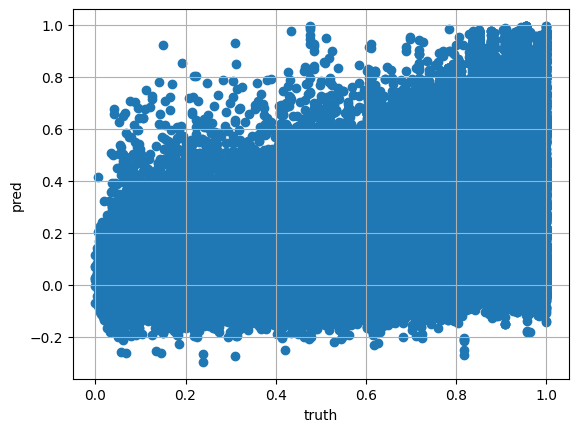

In [90]:
import matplotlib.pyplot as plt
plt.scatter(tanimotos, scores)
plt.ylabel('pred')
plt.xlabel('truth')
plt.grid()

In [91]:
from sklearn.metrics import roc_curve, auc
def plot_roc_curve(y_true, y_scores, title='ROC Curve', roc_file_path='./roc_curve.png'):
        """
        Compute and plot the Receiver Operating Characteristic (ROC) curve.
    
        """
        fpr, tpr, thresholds = roc_curve(y_true, y_scores)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(4, 4))
        plt.plot(fpr, tpr, color='r', lw=2, label=f'AUC = {roc_auc:.2f}')
        #plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('True Positive Rate (TPR)')
        plt.grid()
        plt.title(title)
        plt.legend(loc='lower right')
        plt.savefig(roc_file_path)

In [92]:
ground_truth = [1 if t>0.7 else 0 for t in tanimotos]

In [93]:
import numpy as np
np.sum(ground_truth)

45397

In [94]:
scores_roc = [s if s>0 else 0 for s in scores ]

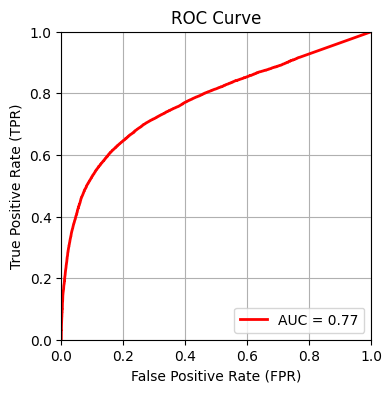

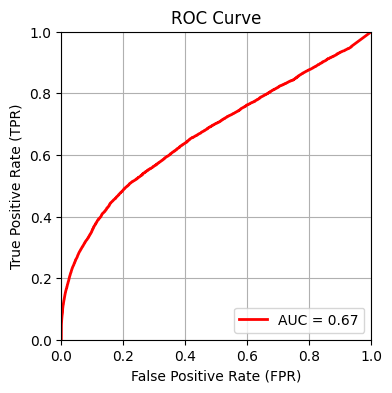

In [95]:
plot_roc_curve(ground_truth, scores_roc)
plot_roc_curve(ground_truth, scores_mod_cos)

## MS2DEEPSCORE

In [96]:
# Load pretrained model
model_ms2d = load_model(model_ms2d_file)

2024-02-02 11:53:05.724310: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2024-02-02 11:53:05.724346: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 36.00 GB
2024-02-02 11:53:05.724361: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 13.50 GB
2024-02-02 11:53:05.724400: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-02-02 11:53:05.724421: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [97]:
similarity_measure = MS2DeepScore(model_ms2d)

In [98]:
# Calculate scores and get matchms.Scores object
scores = calculate_scores([all_spectrums_MATCHMS[0]], [all_spectrums_MATCHMS[0]], similarity_measure)

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]
2024-02-02 11:53:06.436951: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 7ms/step


In [99]:
scores.scores.data[0][0]

1.0

In [100]:
#all_spectrums_MATCHMS[19].plot()

In [132]:
random_molecule_pairs = np.random.choice(range(0,len(molecule_pairs)), size=1000)

In [133]:
random_molecule_pairs[0]

189046

In [139]:
tanimotos= []
scores_ms2d= []
for i in tqdm(random_molecule_pairs):
    m = molecule_pairs[i] 
    hash_0 = m.spectrum_object_0.spectrum_hash
    hash_1 = m.spectrum_object_1.spectrum_hash

    # search for right spectra
    #spectrum_found_0_ms = [s for s,t in zip(preprocessed_spectrums,target_hashes) if t==hash_0 ][0]
    #spectrum_found_1_ms = [s for s,t in zip(preprocessed_spectrums,target_hashes) if t==hash_1 ][0]
    spectrum_found_0_ms = next(s for s, t in zip(preprocessed_spectrums, target_hashes_subset) if t == hash_0)
    spectrum_found_1_ms = next(s for s, t in zip(preprocessed_spectrums, target_hashes_subset) if t == hash_1)
    
    # calculate scores
    if (spectrum_found_0_ms is not None) and (spectrum_found_1_ms is not None):
        #score = calculate_scores([spectrum_found_0_ms], [spectrum_found_1_ms], spec2vec_similarity) 
        #score = score.scores_by_query(spectrum_found_1_ms, sort=True)[0][1]
        scores = calculate_scores([spectrum_found_0_ms], [spectrum_found_1_ms], similarity_measure,)
        tanimotos.append(m.similarity)
        scores_ms2d.append(scores.scores.data[0][0])

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6177.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6364.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16448.25it/s]

1/1 [==============================] - 0s 7ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5210.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7681.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5555.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4215.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

1/1 [==============================] - 0s 8ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6615.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4854.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15827.56it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5053.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12018.06it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7695.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4832.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13706.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6250.83it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12520.31it/s]

1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6132.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9157.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23431.87it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3775.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19152.07it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7884.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3182.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16578.28it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3344.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26886.56it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5849.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11915.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

1/1 [==============================] - 0s 7ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6335.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3731.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12633.45it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8144.28it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5809.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17050.02it/s]


1/1 [==============================] - 0s 10ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5785.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17476.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8081.51it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 8ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9118.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17623.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4132.32it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8559.80it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7738.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8272.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6413.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19152.07it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 2809.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10951.19it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5714.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7410.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4310.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7037.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4032.98it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14315.03it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6452.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4975.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6168.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14873.42it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6808.94it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5071.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27060.03it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3460.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12826.62it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7096.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4877.10it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5152.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14716.86it/s]


1/1 [==============================] - 0s 9ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4080.06it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12483.05it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8422.30it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4447.83it/s]

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7530.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5940.94it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15827.56it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5152.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15827.56it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11366.68it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4258.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13315.25it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7584.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4341.93it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5924.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15420.24it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5683.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11125.47it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7061.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5849.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7307.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7410.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5777.28it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5745.62it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5210.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8208.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3968.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11915.64it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4848.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9279.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27235.74it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7049.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4782.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7002.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10106.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6288.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9000.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6636.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3423.92it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3983.19it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14463.12it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6141.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8490.49it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3398.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11881.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5753.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5440.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9118.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6061.13it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7358.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18315.74it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6797.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5159.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10106.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6797.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5440.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7530.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7449.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11366.68it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5461.33it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15141.89it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6374.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3446.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5957.82it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12157.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6087.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16070.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13025.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9279.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6668.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6288.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5077.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8388.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7653.84it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7869.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8272.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11125.47it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28532.68it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18641.35it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12228.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27594.11it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5817.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5849.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6492.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4609.13it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6096.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6061.13it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6797.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7516.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7913.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27060.03it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7695.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12945.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7639.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5159.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4080.06it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12826.62it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7307.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9446.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8793.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4999.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5322.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7476.48it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8612.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7307.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5152.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13315.25it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8683.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7449.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4181.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6797.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4505.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6061.13it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5295.84it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16194.22it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5178.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4999.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14665.40it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5461.33it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15650.39it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8128.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9118.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5133.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14315.03it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5577.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7096.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 9ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7358.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4760.84it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6626.07it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4549.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10866.07it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8208.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3799.19it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11366.68it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7410.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5691.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6364.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12865.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6615.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5737.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14665.40it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5047.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8128.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11244.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27060.03it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6754.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28728.11it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5315.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4718.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5874.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15650.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3844.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12787.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4219.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12945.38it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27962.03it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6288.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10433.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27235.74it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6492.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6932.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8422.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29330.80it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6374.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8355.19it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7358.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6990.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6853.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6626.07it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16578.28it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11915.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27962.03it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8559.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5991.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5295.84it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15650.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6288.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9776.93it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9822.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4198.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15196.75it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6168.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5745.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7584.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5071.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13486.51it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23696.63it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6250.83it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16980.99it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10010.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11781.75it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7530.17it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11748.75it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8004.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9731.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7626.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11244.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27776.85it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7423.55it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13486.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10433.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12985.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6364.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13662.23it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5555.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9000.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6335.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4691.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11881.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6626.07it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6413.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17772.47it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10106.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11335.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27776.85it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10034.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23696.63it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3718.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11244.78it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4788.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9822.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16448.25it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8208.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8405.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7096.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9776.93it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28728.11it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8112.77it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9731.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5991.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7463.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4100.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8559.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8208.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8943.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8208.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9731.56it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9731.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7449.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9446.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8612.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16980.99it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8943.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10010.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6177.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11459.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29330.80it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4922.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5555.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25420.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5489.93it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14122.24it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11125.47it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26886.56it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5714.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10230.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5184.55it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6326.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14665.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11748.75it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12633.45it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6990.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9157.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9822.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6177.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5915.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14665.40it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4539.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12985.46it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8830.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6543.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4068.19it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13486.51it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5377.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4951.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4064.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8793.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7869.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4364.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7096.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6853.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3326.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7516.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5882.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6335.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4739.33it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13530.01it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5295.84it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7516.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7869.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6842.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5497.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4696.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6204.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7061.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8272.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 8ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6786.90it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 2232.20it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8004.40it/s]

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7626.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6853.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8793.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8388.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9868.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]

1/1 [==============================] - 0s 7ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3688.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12192.74it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7049.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13706.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5714.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8208.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6887.20it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3498.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4629.47it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15650.39it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4624.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4975.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4181.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4443.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13148.29it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4718.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13934.56it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3705.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11915.64it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6132.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15196.75it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4854.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16448.25it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5289.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14563.56it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3731.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12671.61it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8272.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9489.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10433.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4310.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6898.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7049.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8004.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8322.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5915.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6326.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6887.20it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9118.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5777.28it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6932.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6132.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10618.49it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6364.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9000.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4928.68it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15420.24it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3788.89it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5652.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10131.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6615.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9000.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10866.07it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9279.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3701.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12985.46it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4650.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16448.25it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7002.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6786.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4223.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12671.61it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6413.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7516.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5127.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8004.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 10ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6765.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10433.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9446.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26546.23it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5322.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6374.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 2462.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13706.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5127.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6177.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5152.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13443.28it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6710.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14027.77it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6668.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8388.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6502.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10230.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7133.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6288.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6657.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7294.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6204.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10082.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5915.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7476.48it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10082.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6898.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5924.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15827.56it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5349.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14716.86it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4650.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8612.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26886.56it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7084.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17476.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12985.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9000.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6250.83it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10727.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28728.11it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4675.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14027.77it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5841.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15420.24it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5957.82it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9157.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5023.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15650.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6374.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10034.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4739.33it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6615.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7256.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12192.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5102.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14463.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8405.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7989.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5745.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14768.68it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4951.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10010.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5675.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15420.24it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6492.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7108.99it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5377.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3758.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10407.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6533.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10727.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8683.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9868.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6316.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5882.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7358.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5817.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6141.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4563.99it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7681.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5077.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4064.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5562.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12865.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14513.16it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4951.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8612.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5256.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14266.34it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11848.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24818.37it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5518.82it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14315.03it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4848.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14873.42it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6052.39it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11748.75it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8405.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5714.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17772.47it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6288.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25420.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13148.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3647.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17623.13it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8793.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6615.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8559.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4951.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12157.40it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6533.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7133.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9686.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5489.93it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7626.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8338.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5184.55it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14513.16it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4466.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4447.83it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9362.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5210.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13842.59it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4116.10it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5555.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5777.28it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15650.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6105.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14513.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7825.19it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11335.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8338.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5262.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3557.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10866.07it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6026.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8793.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5405.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5071.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13148.29it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7345.54it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3483.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12300.01it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6887.20it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8128.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7767.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6808.94it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3134.76it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4718.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14463.12it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4084.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6898.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7869.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10407.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3297.41it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7410.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8272.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7002.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12483.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27776.85it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6615.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6710.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17331.83it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8559.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7145.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4253.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23696.63it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11366.68it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26546.23it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5622.39it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6250.83it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4707.41it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8004.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3833.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11748.75it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6668.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16980.99it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7037.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5203.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5108.77it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17772.47it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5991.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27776.85it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6754.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12945.38it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10034.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8128.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19152.07it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4905.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5210.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3672.77it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9446.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4675.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14122.24it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7681.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13486.51it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8490.49it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9686.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27776.85it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22919.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9157.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4044.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6668.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27060.03it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9510.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28532.68it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5714.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16320.25it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8830.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5991.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13706.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10180.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8405.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8683.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8208.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12633.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6061.13it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16070.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5370.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13706.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5289.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13888.42it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8004.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6026.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5753.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4854.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6492.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5652.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3486.54it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14716.86it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6492.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5983.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13148.29it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11848.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5745.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3701.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12945.38it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5526.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6932.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14873.42it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5652.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4202.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15141.89it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9868.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 8ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3675.99it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6626.07it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3326.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7503.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12520.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6523.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17772.47it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8665.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5184.55it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12985.46it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7626.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10131.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5262.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9000.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5714.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26886.56it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4860.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11748.75it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24818.37it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8272.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11335.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8422.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6909.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5592.41it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5017.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10010.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6754.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11915.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10407.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6213.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5622.39it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27776.85it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5675.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9597.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4505.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15141.89it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4993.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11881.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22429.43it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3560.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12985.46it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7476.48it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9198.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7695.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7084.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6168.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8559.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6533.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4650.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4696.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6898.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5377.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3460.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14665.40it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5974.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11522.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5023.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7294.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10782.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25420.02it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7108.99it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19152.07it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12483.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10837.99it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10837.99it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5370.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5607.36it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7884.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5683.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5127.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7854.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7738.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18641.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25420.02it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8793.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9776.93it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5592.41it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5809.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4854.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4604.07it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13315.25it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6168.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15827.56it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26886.56it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4190.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14665.40it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7626.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6808.94it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20262.34it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10010.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4387.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12826.62it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5924.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15141.89it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5777.28it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15141.89it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6853.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24818.37it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4993.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14665.40it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9822.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6853.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5384.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10010.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5785.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4198.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22919.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11275.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7626.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7476.48it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6096.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5468.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16448.25it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5526.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5592.41it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5526.09it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5882.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5777.28it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11881.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10645.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27962.03it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8559.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11125.47it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5991.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10131.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10407.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29330.80it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7449.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7584.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7653.84it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7639.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10727.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9597.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7738.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11848.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27776.85it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7145.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5384.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16448.25it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27962.03it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4485.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14768.68it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4951.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12985.46it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6288.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3775.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3366.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14513.16it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6797.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7294.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6132.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9642.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18724.57it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8405.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6853.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10407.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5518.82it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7281.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8943.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27060.03it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4951.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14027.77it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6502.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12710.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9686.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7410.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6615.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4544.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4048.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6250.83it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7256.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5652.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9446.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6710.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5256.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14979.66it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7639.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4975.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10082.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8338.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10727.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10727.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7307.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16194.22it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8943.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5433.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11650.84it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7358.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4568.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14315.03it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11781.75it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6765.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5622.39it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4999.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6533.18it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5511.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10131.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10131.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8683.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5753.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16194.22it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7884.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5809.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14315.03it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7570.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11915.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6710.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10894.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5349.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16448.25it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6853.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11096.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9686.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6105.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23696.63it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9279.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]


1/1 [==============================] - 0s 8ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5497.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6250.83it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11244.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11522.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6990.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10034.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8322.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8388.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6403.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7738.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11366.68it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8128.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3956.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12372.58it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13148.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11244.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6413.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5229.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14513.16it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7639.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5315.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7463.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19152.07it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8272.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10866.07it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11275.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27060.03it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6364.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3865.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11781.75it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6668.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6034.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28728.11it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6326.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29330.80it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6909.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3675.99it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5468.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14716.86it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10230.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 2723.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10433.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4804.47it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3524.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12520.31it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10180.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4634.59it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13706.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11125.47it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8322.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7884.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]


1/1 [==============================] - 0s 10ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5412.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10180.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10106.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8081.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11522.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27235.74it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5882.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7397.36it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5405.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16194.22it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7626.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3688.92it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7397.36it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12520.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27594.11it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5433.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4860.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13530.01it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5041.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10180.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6413.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 2968.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11335.96it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5745.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7639.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16980.99it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3705.22it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16644.06it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6335.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9446.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6543.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14463.12it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5159.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16578.28it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13934.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7096.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9157.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8905.10it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7307.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5584.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6069.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14716.86it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9238.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5809.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6668.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5405.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24818.37it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5349.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22919.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6944.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10727.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27776.85it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15087.42it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5817.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13706.88it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5745.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14315.03it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3557.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13888.42it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9510.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5817.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10180.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8338.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6132.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17331.83it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6132.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19328.59it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7767.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5584.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8830.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5262.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7503.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11244.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24818.37it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17476.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7681.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4002.20it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12483.05it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7626.01it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6213.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11650.84it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5592.41it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16980.99it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3125.41it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10894.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4609.13it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17623.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8905.10it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17476.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13148.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17772.47it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9686.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5622.39it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4951.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16912.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9686.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28532.68it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5817.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5203.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9118.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9446.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3223.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9238.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5047.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8272.79it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8405.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7854.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4165.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13315.25it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6141.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6710.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6668.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16578.28it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23696.63it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9731.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8208.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9000.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9489.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6626.07it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9776.93it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8943.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6990.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6326.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17623.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6887.20it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19152.07it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8081.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6765.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9446.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6168.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8405.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4048.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13842.59it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8848.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6492.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5645.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15827.56it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7145.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6250.83it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9510.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4718.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5645.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10131.17it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3068.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8490.49it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3077.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3637.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13025.79it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10106.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22919.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8004.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7516.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7345.54it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5433.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7157.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7825.19it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5645.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7710.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10082.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24818.37it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8943.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3226.39it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12052.60it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9597.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5190.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5555.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8081.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10381.94it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27594.11it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5745.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6584.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8490.49it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24244.53it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7194.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6887.20it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16320.25it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9425.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5152.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16448.25it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8050.49it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 2770.35it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11748.75it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21399.51it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6026.30it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17260.51it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5053.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11748.75it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4712.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5322.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7825.19it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6502.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4332.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4670.72it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15592.21it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6105.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12985.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26886.56it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4782.56it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4080.06it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13148.29it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5562.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15420.24it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7157.52it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5461.33it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9362.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4624.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13315.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8338.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11214.72it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3533.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12018.06it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7810.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9510.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9597.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9157.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5652.70it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11881.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7989.15it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6754.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11881.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6105.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9198.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8256.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11618.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6932.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12372.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7943.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9915.61it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27594.11it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8701.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5555.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5029.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29537.35it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7884.03it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7476.48it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10205.12it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25731.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7869.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9098.27it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9619.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25575.02it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13706.88it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5777.28it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17848.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5152.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13530.01it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9892.23it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3775.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10837.99it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21620.12it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4017.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8338.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17549.39it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7584.64it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12018.06it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20763.88it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19878.22it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10837.99it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8112.77it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10979.85it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4401.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10512.04it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4505.16it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18641.35it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8774.69it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20867.18it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5412.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14873.42it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4877.10it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14926.35it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9341.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6452.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26214.40it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6990.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18477.11it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8867.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10082.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4691.62it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20262.34it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5433.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14315.03it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5714.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10082.46it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25115.59it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5645.09it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10485.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6808.94it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8192.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7695.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16980.99it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11397.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4198.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14074.85it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7825.19it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6132.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7244.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 8ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6955.73it/s]

Create BinnedSpectrum instances: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5377.31it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6574.14it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6492.73it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21845.33it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4044.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12483.05it/s]

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8756.38it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5849.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13842.59it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4877.10it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11915.64it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3068.25it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18893.26it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 8ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8405.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3761.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12633.45it/s]

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7695.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16131.94it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5777.28it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6944.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20971.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5412.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16710.37it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4899.89it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14513.16it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7752.87it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17623.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9020.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24966.10it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9709.04it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21732.15it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10538.45it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8612.53it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5461.33it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15363.75it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3390.71it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10754.63it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6502.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17189.77it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8630.26it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6335.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15141.89it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6944.21it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5343.06it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9258.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8338.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7695.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21183.35it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8065.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11335.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27060.03it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6132.02it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6297.75it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8081.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18236.10it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11491.24it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 11ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7928.74it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18808.54it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9177.91it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26886.56it/s]

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 8ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3830.41it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17924.38it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11366.68it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24385.49it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8128.50it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9078.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21290.88it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9362.29it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11748.75it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23696.63it/s]

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8924.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8050.49it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9532.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12157.40it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4946.11it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15887.52it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6990.51it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5915.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20068.44it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 3894.43it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10866.07it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7345.54it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5555.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7345.54it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22795.13it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5817.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7738.57it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10330.80it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6297.75it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8683.86it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]

1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7084.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18558.87it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10106.76it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6141.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19152.07it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9597.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4882.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18157.16it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10305.42it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26379.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6765.01it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19599.55it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8338.58it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6364.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11848.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29537.35it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9000.65it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19972.88it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12483.05it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23831.27it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 4718.00it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13148.29it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11008.67it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8542.37it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20360.70it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7695.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19239.93it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7639.90it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22192.08it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9986.44it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24528.09it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6288.31it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11335.96it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22671.91it/s]


1/1 [==============================] - 0s 7ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 5210.32it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20460.02it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 6335.81it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23172.95it/s]


1/1 [==============================] - 0s 6ms/step


Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8473.34it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19691.57it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 7695.97it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

1/1 [==============================] - 0s 6ms/step




Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9799.78it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23301.69it/s]

Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 9597.95it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16384.00it/s]


1/1 [==============================] - 0s 6ms/step



Spectrum binning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 8943.08it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19508.39it/s]

Spectrum binning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11155.06it/s]

Create BinnedSpectrum instances: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22310.13it/s]


1/1 [==============================] - 0s 6ms/step


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:38<00:00, 26.13it/s]


In [140]:
ground_truth = [1 if t>0.7 else 0 for t in tanimotos]

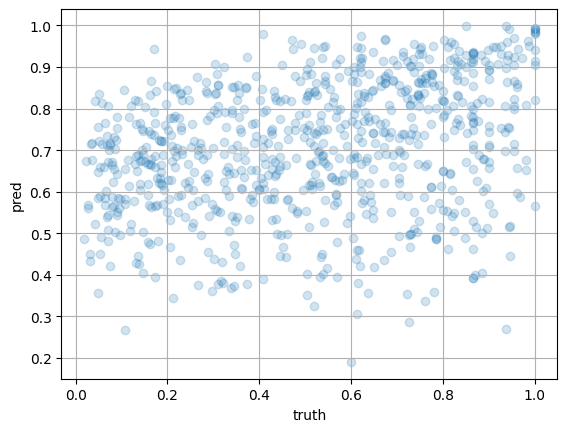

In [141]:
import matplotlib.pyplot as plt
plt.scatter(tanimotos, scores_ms2d, alpha=0.2)
plt.ylabel('pred')
plt.xlabel('truth')
plt.grid()

In [142]:
scores_roc = [s if s>0 else 0 for s in scores_ms2d]

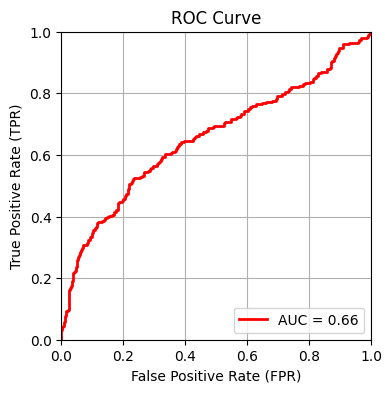

In [143]:

plot_roc_curve(ground_truth, scores_ms2d)